In [1]:
# =====================================================================================
# ANALIZADOR MULTI-MODELO DE ENFERMEDADES DE MAÍZ CON EVALUACIÓN
# Clasificación con múltiples modelos + Evaluación de precisión
# =====================================================================================

import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import warnings
from tensorflow.keras.models import load_model
import pandas as pd
from datetime import datetime
import json

warnings.filterwarnings('ignore')

print("🌽 Analizador Multi-Modelo de Enfermedades de Maíz v3.0")
print("=" * 60)

# =====================================================================================
# CONFIGURACIÓN PRINCIPAL
# =====================================================================================

MODELS_PATH = Path("modelos")
RESULTS_PATH = Path("disease_analysis_results")
RESULTS_PATH.mkdir(exist_ok=True)

# Clases de enfermedades
CLASS_NAMES = {
    0: 'Northern Leaf Blight',
    1: 'Gray Leaf Spot', 
    2: 'Common Rust',
    3: 'Healthy'
}

# Mapeo de nombres de archivo a clases esperadas
FILENAME_TO_CLASS = {
    'grayleaf': 'Gray Leaf Spot',
    'northern': 'Northern Leaf Blight',
    'rust': 'Common Rust',
    'sana': 'Healthy',
    'healthy': 'Healthy'
}

# =====================================================================================
# PARÁMETROS DE DETECCIÓN DE LESIONES
# =====================================================================================

DETECTION_PARAMS = {
    "Gray Leaf Spot": {
        "method": "bright_spots",  
        "brightness_threshold": 0.3, "min_area": 20, "max_area": 10000,
        "max_aspect_ratio": 6, "morphology_kernel": (7, 5), "color_overlay": [255, 100, 0]
    },
    "Northern Leaf Blight": {
        "method": "dark_spots", "min_area": 30, "max_area": 50000, "max_aspect_ratio": 20,
        "morphology_kernel": (5, 3), "color_overlay": [255, 0, 0]
    },
    "Common Rust": {
        "method": "rust_color", "hsv_lower": [5, 40, 40], "hsv_upper": [25, 255, 255],
        "min_area": 10, "max_area": 2000, "max_aspect_ratio": 3,
        "morphology_kernel": (3, 3), "color_overlay": [255, 255, 0]
    },
    "Healthy": { "method": "none", "color_overlay": [0, 255, 0] }
}

# =====================================================================================
# FUNCIONES DE PREPROCESAMIENTO
# =====================================================================================

def adaptive_median_filter(image, min_window=3, max_window=7):
    """Implementación completa del Adaptive Median Filter."""
    def level_A(img, row, col, window_size, max_size):
        half_window = window_size // 2
        y_start, y_end = max(0, row - half_window), min(img.shape[0], row + half_window + 1)
        x_start, x_end = max(0, col - half_window), min(img.shape[1], col + half_window + 1)
        window = img[y_start:y_end, x_start:x_end]
        z_min, z_max, z_med = np.min(window), np.max(window), np.median(window)
        if z_min < z_med < z_max:
            return level_B(img, row, col, z_min, z_med, z_max)
        else:
            window_size += 2
            if window_size <= max_size:
                return level_A(img, row, col, window_size, max_size)
            else:
                return z_med
    def level_B(img, row, col, z_min, z_med, z_max):
        z_xy = img[row, col]
        return z_xy if z_min < z_xy < z_max else z_med
    if len(image.shape) != 2: raise ValueError("AMF requiere imagen en escala de grises (2D)")
    filtered_img = np.copy(image).astype(np.float64)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            filtered_img[i, j] = level_A(image, i, j, min_window, max_window)
    return filtered_img.astype(np.uint8)

def preprocess_image_for_model(image_path, img_size=(256, 256)):
    img = cv2.imread(str(image_path))
    if img is None: return None
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # CLAHE más agresivo
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(4,4))
    l = clahe.apply(l)
    
    # Aumentar saturación más
    img_rgb = cv2.cvtColor(cv2.merge([l,a,b]), cv2.COLOR_LAB2RGB)
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:,:,1] = np.clip(hsv[:,:,1] * 1.5, 0, 255)
    hsv[:,:,2] = np.clip(hsv[:,:,2] * 1.1, 0, 255)  # brillo
    img_rgb = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
    
    # Sharpening
    kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    img_rgb = cv2.filter2D(img_rgb, -1, kernel)
    
    img_resized = cv2.resize(img_rgb, img_size)
    return (img_resized / 255.0).astype(np.float32)

# =====================================================================================
# FUNCIONES DE DETECCIÓN DE LESIONES
# =====================================================================================

def detect_gray_leaf_spot(image, params):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l_channel = lab[:,:,0]
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    leaf_mask = (gray > 15).astype(np.uint8) * 255
    leaf_pixels = l_channel[leaf_mask > 0]
    if len(leaf_pixels) == 0: return np.zeros_like(gray)
    leaf_mean, leaf_std = np.mean(leaf_pixels), np.std(leaf_pixels)
    threshold = leaf_mean + params["brightness_threshold"] * leaf_std
    bright_mask = (l_channel > threshold).astype(np.uint8) * 255
    lesion_mask = cv2.bitwise_and(bright_mask, leaf_mask)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, params["morphology_kernel"])
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_CLOSE, kernel)
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_OPEN, np.ones((2,2), np.uint8))
    contours, _ = cv2.findContours(lesion_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean_mask = np.zeros_like(lesion_mask)
    for contour in contours:
        area = cv2.contourArea(contour)
        if params["min_area"] <= area <= params["max_area"]:
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = max(w, h) / max(min(w, h), 1)
            if aspect_ratio <= params["max_aspect_ratio"]:
                cv2.fillPoly(clean_mask, [contour], 255)
    return clean_mask

def detect_northern_leaf_blight(image, params):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    leaf_mask = (gray > 15).astype(np.uint8) * 255
    lower_lesion = np.array([8, 40, 50])
    upper_lesion = np.array([25, 200, 180])
    lesion_mask = cv2.inRange(hsv, lower_lesion, upper_lesion)
    lesion_mask = cv2.bitwise_and(lesion_mask, leaf_mask)
    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 7))
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_CLOSE, kernel_close)
    kernel_dilate = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 3))
    lesion_mask = cv2.dilate(lesion_mask, kernel_dilate, iterations=1)
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_OPEN, kernel_open)
    contours, _ = cv2.findContours(lesion_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean_mask = np.zeros_like(lesion_mask)
    for contour in contours:
        if cv2.contourArea(contour) >= 30:
            cv2.fillPoly(clean_mask, [contour], 255)
    return clean_mask

def detect_common_rust(image, params):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    leaf_mask = (gray > 15).astype(np.uint8) * 255
    lower = np.array(params["hsv_lower"])
    upper = np.array(params["hsv_upper"])
    color_mask = cv2.inRange(hsv, lower, upper)
    lesion_mask = cv2.bitwise_and(color_mask, leaf_mask)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, params["morphology_kernel"])
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_CLOSE, kernel)
    lesion_mask = cv2.morphologyEx(lesion_mask, cv2.MORPH_OPEN, np.ones((2,2), np.uint8))
    contours, _ = cv2.findContours(lesion_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean_mask = np.zeros_like(lesion_mask)
    for contour in contours:
        area = cv2.contourArea(contour)
        if params["min_area"] <= area <= params["max_area"]:
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = max(w, h) / max(min(w, h), 1)
            if aspect_ratio <= params["max_aspect_ratio"]:
                cv2.fillPoly(clean_mask, [contour], 255)
    return clean_mask

def detect_lesions(image, disease_name):
    if disease_name == "Healthy": return np.zeros(image.shape[:2], dtype=np.uint8)
    params = DETECTION_PARAMS.get(disease_name)
    if not params: return np.zeros(image.shape[:2], dtype=np.uint8)
    if params["method"] == "bright_spots": return detect_gray_leaf_spot(image, params)
    elif params["method"] == "dark_spots": return detect_northern_leaf_blight(image, params)
    elif params["method"] == "rust_color": return detect_common_rust(image, params)
    else: return np.zeros(image.shape[:2], dtype=np.uint8)

# =====================================================================================
# CARGA DE MÚLTIPLES MODELOS
# =====================================================================================

def load_all_models():
    """Carga todos los modelos .h5 disponibles en la carpeta models_trained."""
    models = {}
    model_files = list(MODELS_PATH.glob("*.h5"))
    
    if not model_files:
        print(f"❌ No se encontraron modelos en {MODELS_PATH}")
        return models
    
    print(f"📂 Encontrados {len(model_files)} modelos en {MODELS_PATH}")
    print("-" * 60)
    
    for model_path in model_files:
        try:
            print(f"  🧠 Cargando: {model_path.name}...", end=" ")
            model = load_model(model_path, compile=False)
            model.name = model_path.stem  # Usar el nombre del archivo sin extensión
            models[model_path.stem] = model
            print("✅")
        except Exception as e:
            print(f"❌ Error: {str(e)[:50]}")
    
    print(f"\n✅ Se cargaron {len(models)} modelos exitosamente")
    return models

# =====================================================================================
# ANALIZADOR MULTI-MODELO
# =====================================================================================

class MultiModelDiseaseAnalyzer:
    def __init__(self, models):
        self.models = models
    
    def classify_with_all_models(self, image_path):
        """Clasifica una imagen con todos los modelos disponibles."""
        processed_img = preprocess_image_for_model(image_path)
        if processed_img is None: 
            return None
        
        img_batch = np.expand_dims(processed_img, axis=0)
        predictions = {}
        
        for model_name, model in self.models.items():
            try:
                pred = model.predict(img_batch, verbose=0)[0]
                class_idx = np.argmax(pred)
                confidence = np.max(pred)
                
                predictions[model_name] = {
                    'class_idx': int(class_idx),
                    'class_name': CLASS_NAMES[class_idx],
                    'confidence': float(confidence),
                    'all_probabilities': {CLASS_NAMES[i]: float(pred[i]) for i in range(len(pred))}
                }
            except Exception as e:
                print(f"    ⚠️ Error con modelo {model_name}: {str(e)[:50]}")
                predictions[model_name] = None
        
        return predictions
    
    def get_ensemble_prediction(self, predictions):
        """Obtiene predicción por ensemble (promedio de probabilidades)."""
        valid_preds = [p for p in predictions.values() if p is not None]
        if not valid_preds:
            return None
        
        # Promediar las probabilidades de todos los modelos
        ensemble_probs = np.zeros(len(CLASS_NAMES))
        for pred in valid_preds:
            for i, class_name in CLASS_NAMES.items():
                ensemble_probs[i] += pred['all_probabilities'][class_name]
        
        ensemble_probs /= len(valid_preds)
        
        class_idx = np.argmax(ensemble_probs)
        return {
            'class_idx': int(class_idx),
            'class_name': CLASS_NAMES[class_idx],
            'confidence': float(ensemble_probs[class_idx]),
            'all_probabilities': {CLASS_NAMES[i]: float(ensemble_probs[i]) for i in range(len(ensemble_probs))}
        }
    
    def analyze_lesion_area(self, image_path, disease_name):
        """Analiza el área de lesión."""
        original_img = cv2.imread(str(image_path))
        if original_img is None: return None
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        lesion_mask = detect_lesions(original_img, disease_name)
        leaf_gray = cv2.cvtColor(original_img, cv2.COLOR_RGB2GRAY)
        leaf_area = np.sum(leaf_gray > 15)
        lesion_area = np.sum(lesion_mask > 0)
        percentage = (lesion_area / leaf_area * 100) if leaf_area > 0 else 0
        
        if percentage == 0: severity = "Ninguna"
        elif percentage <= 10: severity = "Leve"
        elif percentage <= 30: severity = "Moderada"
        elif percentage <= 50: severity = "Severa"
        else: severity = "Muy Severa"
        
        contours, _ = cv2.findContours(lesion_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        num_lesions = len([c for c in contours if cv2.contourArea(c) > 10])
        
        return {
            'lesion_mask': lesion_mask, 'original_image': original_img,
            'leaf_area': int(leaf_area), 'lesion_area': int(lesion_area),
            'percentage_affected': round(percentage, 1), 'severity': severity,
            'num_lesions': num_lesions,
            'avg_lesion_area': round(lesion_area / max(num_lesions, 1), 1)
        }

# =====================================================================================
# FUNCIÓN DE EVALUACIÓN
# =====================================================================================

def get_expected_class_from_filename(filename):
    """Obtiene la clase esperada basándose en el nombre del archivo."""
    filename_lower = filename.lower()
    
    for key, expected_class in FILENAME_TO_CLASS.items():
        if key in filename_lower:
            return expected_class
    
    return None

def evaluate_predictions(filename, predictions, expected_class):
    """Evalúa las predicciones de todos los modelos contra la clase esperada."""
    evaluation = {
        'filename': filename,
        'expected_class': expected_class,
        'model_predictions': {},
        'model_accuracies': {}
    }
    
    for model_name, pred in predictions.items():
        if pred is None:
            evaluation['model_predictions'][model_name] = 'Error'
            evaluation['model_accuracies'][model_name] = False
        else:
            evaluation['model_predictions'][model_name] = pred['class_name']
            evaluation['model_accuracies'][model_name] = (pred['class_name'] == expected_class)
    
    return evaluation

# =====================================================================================
# ANÁLISIS DE CARPETA CON MÚLTIPLES MODELOS
# =====================================================================================

def analyze_folder_multi_model(folder_path, save_report=True, show_images=True):
    """
    Analiza todas las imágenes en una carpeta con todos los modelos disponibles
    y evalúa la precisión basándose en los nombres de archivo.
    """
    # Cargar todos los modelos
    models = load_all_models()
    if not models:
        print("❌ No se pudieron cargar modelos")
        return None
    
    analyzer = MultiModelDiseaseAnalyzer(models)
    
    folder = Path(folder_path)
    if not folder.is_dir():
        print(f"❌ Error: La ruta '{folder_path}' no es una carpeta válida.")
        return None
    
    # Encontrar todos los archivos de imagen
    image_extensions = ['.jpg', '.jpeg', '.png']
    image_files = [f for f in folder.iterdir() if f.suffix.lower() in image_extensions]
    
    if not image_files:
        print(f"⚠️ No se encontraron imágenes en la carpeta '{folder_path}'.")
        return None
    
    print(f"\n📂 Iniciando análisis de {len(image_files)} imágenes")
    print("=" * 60)
    
    all_results = []
    model_correct_counts = {model_name: 0 for model_name in models.keys()}
    model_total_counts = {model_name: 0 for model_name in models.keys()}
    ensemble_correct = 0
    ensemble_total = 0
    
    # Procesar cada imagen
    for i, image_path in enumerate(image_files):
        print(f"\n[{i+1}/{len(image_files)}] Analizando: {image_path.name}")
        print("-" * 40)
        
        # Obtener clase esperada del nombre del archivo
        expected_class = get_expected_class_from_filename(image_path.stem)
        if expected_class:
            print(f"  📍 Clase esperada: {expected_class}")
        else:
            print(f"  ⚠️ No se pudo determinar la clase esperada del nombre")
        
        # Clasificar con todos los modelos
        predictions = analyzer.classify_with_all_models(str(image_path))
        
        if predictions:
            # Obtener predicción ensemble
            ensemble_pred = analyzer.get_ensemble_prediction(predictions)
            
            # Mostrar predicciones en texto
            print(f"  🤖 Predicciones de los modelos:")
            for model_name, pred in predictions.items():
                if pred:
                    is_correct = "✅" if expected_class and pred['class_name'] == expected_class else "❌"
                    print(f"    • {model_name}: {pred['class_name']} ({pred['confidence']:.1%}) {is_correct}")
                    
                    # Actualizar contadores
                    if expected_class:
                        model_total_counts[model_name] += 1
                        if pred['class_name'] == expected_class:
                            model_correct_counts[model_name] += 1
                else:
                    print(f"    • {model_name}: Error en predicción")
            
            # Mostrar predicción ensemble y calcular análisis de lesiones
            lesion_analysis = None
            if ensemble_pred:
                is_correct = "✅" if expected_class and ensemble_pred['class_name'] == expected_class else "❌"
                print(f"  🔮 Predicción Ensemble: {ensemble_pred['class_name']} ({ensemble_pred['confidence']:.1%}) {is_correct}")
                
                if expected_class:
                    ensemble_total += 1
                    if ensemble_pred['class_name'] == expected_class:
                        ensemble_correct += 1
                
                # Analizar área de lesión con la predicción ensemble
                lesion_analysis = analyzer.analyze_lesion_area(str(image_path), ensemble_pred['class_name'])
                if lesion_analysis:
                    print(f"  📊 Área afectada: {lesion_analysis['percentage_affected']}% - Severidad: {lesion_analysis['severity']}")
            
            # === VISUALIZACIÓN DE LA IMAGEN (Nuevo) ===
            if show_images and ensemble_pred:
                # save_result=False para que te las muestre en pantalla pero no te llene el disco de imágenes PNG
                create_comparison_visualization(image_path, predictions, ensemble_pred, lesion_analysis, save_result=False)
            
            # Guardar resultados
            result = {
                'filename': image_path.name,
                'expected_class': expected_class,
                'predictions': predictions,
                'ensemble_prediction': ensemble_pred,
                'lesion_analysis': lesion_analysis if ensemble_pred else None
            }
            all_results.append(result)
    
    # =====================================================================================
    # RESUMEN FINAL
    # =====================================================================================
    
    print("\n" + "=" * 60)
    print("📊 RESUMEN DE EVALUACIÓN")
    print("=" * 60)
    
    # Calcular y mostrar precisión por modelo
    print("\n🎯 PRECISIÓN POR MODELO:")
    print("-" * 40)
    
    model_accuracies = {}
    for model_name in models.keys():
        if model_total_counts[model_name] > 0:
            accuracy = (model_correct_counts[model_name] / model_total_counts[model_name]) * 100
            model_accuracies[model_name] = accuracy
            print(f"  • {model_name}: {model_correct_counts[model_name]}/{model_total_counts[model_name]} "
                  f"({accuracy:.1f}% de precisión)")
        else:
            print(f"  • {model_name}: Sin predicciones válidas")
    
    # Mostrar precisión del ensemble
    ensemble_accuracy = 0
    if ensemble_total > 0:
        ensemble_accuracy = (ensemble_correct / ensemble_total) * 100
        print(f"\n🔮 PRECISIÓN DEL ENSEMBLE: {ensemble_correct}/{ensemble_total} ({ensemble_accuracy:.1f}%)")
    
    # Encontrar mejor modelo
    best_model = None
    if model_accuracies:
        best_model = max(model_accuracies, key=model_accuracies.get)
        print(f"\n🏆 MEJOR MODELO: {best_model} ({model_accuracies[best_model]:.1f}% de precisión)")
    
    # =====================================================================================
    # MATRIZ DE CONFUSIÓN
    # =====================================================================================
    
    print("\n📋 MATRIZ DE CONFUSIÓN (Ensemble):")
    print("-" * 40)
    
    # Crear matriz de confusión
    confusion_matrix = {}
    for class_name in CLASS_NAMES.values():
        confusion_matrix[class_name] = {cn: 0 for cn in CLASS_NAMES.values()}
    
    for result in all_results:
        if result['expected_class'] and result['ensemble_prediction']:
            expected = result['expected_class']
            predicted = result['ensemble_prediction']['class_name']
            if expected in confusion_matrix:
                confusion_matrix[expected][predicted] += 1
    
    # Mostrar matriz
    print("\n" + " " * 25 + "PREDICCIONES")
    print(" " * 10 + "".join(f"{cn[:10]:^12}" for cn in CLASS_NAMES.values()))
    print("REAL" + " " * 6 + "-" * 48)
    
    for true_class in CLASS_NAMES.values():
        row = f"{true_class[:15]:<15} |"
        for pred_class in CLASS_NAMES.values():
            count = confusion_matrix[true_class][pred_class]
            row += f"{count:^12}"
        print(row)
    
    # =====================================================================================
    # GUARDAR REPORTE
    # =====================================================================================
    
    if save_report:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        
        # Guardar resumen en CSV
        summary_data = []
        for result in all_results:
            row = {
                'filename': result['filename'],
                'expected_class': result['expected_class'] or 'Unknown',
                'ensemble_prediction': result['ensemble_prediction']['class_name'] if result['ensemble_prediction'] else 'Error',
                'ensemble_confidence': f"{result['ensemble_prediction']['confidence']:.1%}" if result['ensemble_prediction'] else 'N/A',
                'percentage_affected': f"{result['lesion_analysis']['percentage_affected']}%" if result['lesion_analysis'] else 'N/A',
                'severity': result['lesion_analysis']['severity'] if result['lesion_analysis'] else 'N/A'
            }
            
            # Agregar predicciones de cada modelo
            for model_name in models.keys():
                if model_name in result['predictions'] and result['predictions'][model_name]:
                    row[f'{model_name}_prediction'] = result['predictions'][model_name]['class_name']
                    row[f'{model_name}_confidence'] = f"{result['predictions'][model_name]['confidence']:.1%}"
                else:
                    row[f'{model_name}_prediction'] = 'Error'
                    row[f'{model_name}_confidence'] = 'N/A'
            
            summary_data.append(row)
        
        df = pd.DataFrame(summary_data)
        csv_path = RESULTS_PATH / f"multi_model_analysis_{timestamp}.csv"
        df.to_csv(csv_path, index=False)
        print(f"\n📁 Reporte CSV guardado en: {csv_path}")
        
        # Guardar reporte JSON detallado
        json_report = {
            'timestamp': timestamp,
            'folder_analyzed': str(folder_path),
            'total_images': len(image_files),
            'models_used': list(models.keys()),
            'model_accuracies': {k: f"{v:.1f}%" for k, v in model_accuracies.items()},
            'ensemble_accuracy': f"{ensemble_accuracy:.1f}%" if ensemble_total > 0 else "N/A",
            'best_model': best_model if model_accuracies else None,
            'confusion_matrix': confusion_matrix,
            'detailed_results': []
        }
        
        for result in all_results:
            json_result = {
                'filename': result['filename'],
                'expected_class': result['expected_class'],
                'predictions': {}
            }
            
            for model_name, pred in result['predictions'].items():
                if pred:
                    json_result['predictions'][model_name] = {
                        'class': pred['class_name'],
                        'confidence': round(pred['confidence'], 3),
                        'correct': pred['class_name'] == result['expected_class'] if result['expected_class'] else None
                    }
            
            if result['ensemble_prediction']:
                json_result['ensemble'] = {
                    'class': result['ensemble_prediction']['class_name'],
                    'confidence': round(result['ensemble_prediction']['confidence'], 3),
                    'correct': result['ensemble_prediction']['class_name'] == result['expected_class'] if result['expected_class'] else None
                }
            
            if result['lesion_analysis']:
                json_result['lesion_analysis'] = {
                    'percentage_affected': result['lesion_analysis']['percentage_affected'],
                    'severity': result['lesion_analysis']['severity'],
                    'num_lesions': result['lesion_analysis']['num_lesions']
                }
            
            json_report['detailed_results'].append(json_result)
        
        json_path = RESULTS_PATH / f"multi_model_analysis_{timestamp}.json"
        with open(json_path, 'w') as f:
            json.dump(json_report, f, indent=2)
        print(f"📁 Reporte JSON guardado en: {json_path}")
    
    print("\n✅ Análisis multi-modelo completado exitosamente")
    
    return {
        'results': all_results,
        'model_accuracies': model_accuracies,
        'ensemble_accuracy': ensemble_accuracy if ensemble_total > 0 else None,
        'confusion_matrix': confusion_matrix,
        'best_model': best_model if model_accuracies else None
    }

# =====================================================================================
# VISUALIZACIÓN DE RESULTADOS COMPARATIVOS
# =====================================================================================

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

def create_comparison_visualization(image_path, predictions, ensemble_pred, lesion_analysis, save_result=True):
    """
    Versión V3: Dashboard con máscara binaria limpia (sin superposición) para mayor claridad.
    """
    if not predictions or not ensemble_pred:
        print("❌ Error: No se pudo completar la visualización")
        return
    
    # Preparar imagen original
    if lesion_analysis and 'original_image' in lesion_analysis:
        original_img = lesion_analysis['original_image']
    else:
        original_img = cv2.cvtColor(cv2.imread(str(image_path)), cv2.COLOR_BGR2RGB)

    # Configuración del Dashboard
    plt.style.use('default')
    fig = plt.figure(figsize=(16, 9))
    fig.patch.set_facecolor('#f8f9fa')
    
    # Grid: 2 filas, 3 columnas arriba (Original, Máscara, Info), 1 columna abajo (Gráfico)
    gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.8], width_ratios=[1, 1, 1.5])
    
    # --- 1. IMAGEN ORIGINAL (Arriba Izquierda) ---
    ax_img = plt.subplot(gs[0, 0])
    ax_img.imshow(original_img)
    ax_img.set_title("Imagen Original", fontsize=12, fontweight='bold', pad=10)
    ax_img.axis('off')
    
    # --- 2. MÁSCARA BINARIA (Arriba Centro) ---
    ax_mask = plt.subplot(gs[0, 1])
    if lesion_analysis:
        # Aquí está el cambio: Mostramos la máscara directa con mapa de color ROJO sobre BLANCO
        # cmap='Reds': 0 es blanco, 255 es rojo oscuro
        ax_mask.imshow(lesion_analysis['lesion_mask'], cmap='Reds', vmin=0, vmax=255)
        
        percentage = lesion_analysis['percentage_affected']
        ax_mask.set_title(f"Máscara Binaria ({percentage}% Área)", fontsize=12, fontweight='bold', pad=10, color='#d63031')
        
        # Borde opcional para que se note el recuadro blanco si la máscara es muy vacía
        for spine in ax_mask.spines.values():
            spine.set_visible(True)
            spine.set_color('#e0e0e0')
    else:
        ax_mask.text(0.5, 0.5, "Sin Lesiones", ha='center', va='center')
        ax_mask.set_title("Máscara", fontsize=12, fontweight='bold')
        ax_mask.axis('off')
        
    # Desactivar ejes (números) pero mantener el cuadro
    ax_mask.set_xticks([])
    ax_mask.set_yticks([])

    # --- 3. PANEL DE INFO (Arriba Derecha) ---
    ax_info = plt.subplot(gs[0, 2])
    ax_info.axis('off')
    
    # Texto del Ensemble
    ax_info.text(0.5, 0.85, "PREDICCIÓN FINAL", ha='center', va='center', fontsize=10, color='gray', fontweight='bold')
    ax_info.text(0.5, 0.70, ensemble_pred['class_name'], ha='center', va='center', fontsize=18, fontweight='bold', color='#2d3436')
    
    conf_color = '#00b894' if ensemble_pred['confidence'] > 0.8 else '#fdcb6e' if ensemble_pred['confidence'] > 0.6 else '#d63031'
    ax_info.text(0.5, 0.55, f"Confianza: {ensemble_pred['confidence']:.1%}", ha='center', va='center', fontsize=14, color=conf_color, fontweight='bold')
    
    if lesion_analysis:
        sev = lesion_analysis['severity']
        sev_color = 'green' if sev == 'Ninguna' else 'orange' if sev in ['Leve', 'Moderada'] else 'red'
        ax_info.text(0.5, 0.35, f"Severidad: {sev}", ha='center', va='center', fontsize=12, fontweight='bold', 
                    bbox=dict(facecolor=sev_color, alpha=0.1, edgecolor=sev_color, boxstyle='round,pad=0.5'))
        ax_info.text(0.5, 0.20, f"Lesiones detectadas: {lesion_analysis['num_lesions']}", ha='center', va='center', fontsize=10, color='gray')

    # --- 4. GRÁFICO COMPARATIVO (Abajo) ---
    ax_chart = plt.subplot(gs[1, :])
    
    model_names = list(predictions.keys())
    confidences = [p['confidence'] if p else 0 for p in predictions.values()]
    colors = ['#0984e3' if c > 0.8 else '#74b9ff' for c in confidences] 
    
    # Añadir Ensemble
    model_names.append("ENSEMBLE")
    confidences.append(ensemble_pred['confidence'])
    colors.append('#00b894') 
    
    y_pos = np.arange(len(model_names))
    bars = ax_chart.barh(y_pos, confidences, align='center', color=colors, height=0.6)
    
    ax_chart.set_yticks(y_pos)
    ax_chart.set_yticklabels(model_names, fontsize=10, fontweight='bold')
    ax_chart.set_xlim(0, 1.15) 
    ax_chart.set_xlabel('Nivel de Confianza', fontsize=10)
    ax_chart.set_title('Comparativa de Modelos vs Ensemble', fontsize=11, fontweight='bold', pad=15)
    
    ax_chart.spines['top'].set_visible(False)
    ax_chart.spines['right'].set_visible(False)
    ax_chart.spines['left'].set_visible(False)
    ax_chart.grid(axis='x', linestyle='--', alpha=0.3)
    
    for i, bar in enumerate(bars):
        width = bar.get_width()
        model_pred_class = predictions[model_names[i]]['class_name'] if i < len(predictions) else ensemble_pred['class_name']
        label_text = f" {model_pred_class} ({width:.1%})"
        ax_chart.text(width, bar.get_y() + bar.get_height()/2, label_text, 
                     va='center', fontsize=10, fontweight='bold', color='#2d3436')

    plt.suptitle(f"Análisis Multi-Modelo: {Path(image_path).name}", fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.subplots_adjust(top=0.90, hspace=0.3)
    
    if save_result:
        save_path = RESULTS_PATH / f"dashboard_{Path(image_path).stem}.png"
        plt.savefig(save_path, dpi=150, bbox_inches='tight', facecolor='#f8f9fa')
        print(f"  📁 Dashboard guardado: {save_path}")
    
    plt.show()

def plot_accuracy_comparison(model_accuracies, ensemble_accuracy):
    """Crea un gráfico de barras comparando las precisiones de los modelos."""
    if not model_accuracies:
        print("No hay datos de precisión para graficar")
        return
    
    # Preparar datos
    models = list(model_accuracies.keys()) + ['ENSEMBLE']
    accuracies = list(model_accuracies.values()) + [ensemble_accuracy if ensemble_accuracy else 0]
    
    # Crear gráfico
    plt.figure(figsize=(12, 6))
    bars = plt.bar(models, accuracies, color=['steelblue']*len(model_accuracies) + ['gold'])
    
    # Agregar valores encima de las barras
    for bar, acc in zip(bars, accuracies):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold')
    
    plt.title('Comparación de Precisión entre Modelos', fontsize=14, fontweight='bold')
    plt.xlabel('Modelo', fontsize=12)
    plt.ylabel('Precisión (%)', fontsize=12)
    plt.ylim(0, 110)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    
    save_path = RESULTS_PATH / "model_accuracy_comparison.png"
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"\n📊 Gráfico de precisión guardado: {save_path}")
    plt.show()

# =====================================================================================
# FUNCIONES DE ANÁLISIS INDIVIDUAL CON MÚLTIPLES MODELOS
# =====================================================================================

def analyze_single_image_multi_model(image_path, show_visualization=True):
    """
    Analiza una sola imagen con todos los modelos disponibles.
    """
    # Cargar todos los modelos
    models = load_all_models()
    if not models:
        print("❌ No se pudieron cargar modelos")
        return None
    
    analyzer = MultiModelDiseaseAnalyzer(models)
    
    print(f"\n🔬 ANÁLISIS MULTI-MODELO: {Path(image_path).name}")
    print("=" * 60)
    
    # Clasificar con todos los modelos
    predictions = analyzer.classify_with_all_models(image_path)
    
    if not predictions:
        print("❌ Error en las predicciones")
        return None
    
    # Obtener predicción ensemble
    ensemble_pred = analyzer.get_ensemble_prediction(predictions)
    
    # Mostrar resultados
    print("\n🤖 Predicciones de los Modelos:")
    print("-" * 40)
    for model_name, pred in predictions.items():
        if pred:
            print(f"  • {model_name}:")
            print(f"    - Clase: {pred['class_name']}")
            print(f"    - Confianza: {pred['confidence']:.1%}")
        else:
            print(f"  • {model_name}: Error en predicción")
    
    print(f"\n🔮 Predicción Ensemble:")
    print(f"  - Clase: {ensemble_pred['class_name']}")
    print(f"  - Confianza: {ensemble_pred['confidence']:.1%}")
    
    # Analizar lesiones con la predicción ensemble
    lesion_analysis = analyzer.analyze_lesion_area(image_path, ensemble_pred['class_name'])
    
    if lesion_analysis:
        print(f"\n📊 Análisis de Lesiones:")
        print(f"  - Área afectada: {lesion_analysis['percentage_affected']}%")
        print(f"  - Severidad: {lesion_analysis['severity']}")
        print(f"  - Número de lesiones: {lesion_analysis['num_lesions']}")
    
    # Crear visualización comparativa si se solicita
    if show_visualization:
        create_comparison_visualization(image_path, predictions, ensemble_pred, lesion_analysis)
    
    return {
        'predictions': predictions,
        'ensemble_prediction': ensemble_pred,
        'lesion_analysis': lesion_analysis
    }

# =====================================================================================
# BLOQUE PRINCIPAL DE INICIALIZACIÓN
# =====================================================================================

if __name__ == "__main__":
    print("\n🚀 Sistema Multi-Modelo de Análisis de Enfermedades de Maíz")
    print("=" * 60)
    print("\nFunciones disponibles:")
    print("  • analyze_folder_multi_model('/ruta/carpeta') - Analiza carpeta con todos los modelos")
    print("  • analyze_single_image_multi_model('/ruta/imagen.jpg') - Analiza una imagen")
    print("  • plot_accuracy_comparison(model_accuracies, ensemble_accuracy) - Grafica precisiones")
    print("\nEjemplo de uso:")
    print("  results = analyze_folder_multi_model('/segmented_results4')")
    print("\n✅ Sistema listo para usar")

🌽 Analizador Multi-Modelo de Enfermedades de Maíz v3.0

🚀 Sistema Multi-Modelo de Análisis de Enfermedades de Maíz

Funciones disponibles:
  • analyze_folder_multi_model('/ruta/carpeta') - Analiza carpeta con todos los modelos
  • analyze_single_image_multi_model('/ruta/imagen.jpg') - Analiza una imagen
  • plot_accuracy_comparison(model_accuracies, ensemble_accuracy) - Grafica precisiones

Ejemplo de uso:
  results = analyze_folder_multi_model('/segmented_results4')

✅ Sistema listo para usar


📂 Encontrados 1 modelos en modelos
------------------------------------------------------------
  🧠 Cargando: model_v16.h5... ✅

✅ Se cargaron 1 modelos exitosamente

📂 Iniciando análisis de 54 imágenes

[1/54] Analizando: grayleaf-1.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.0%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.0%) ✅
  📊 Área afectada: 8.7% - Severidad: Leve


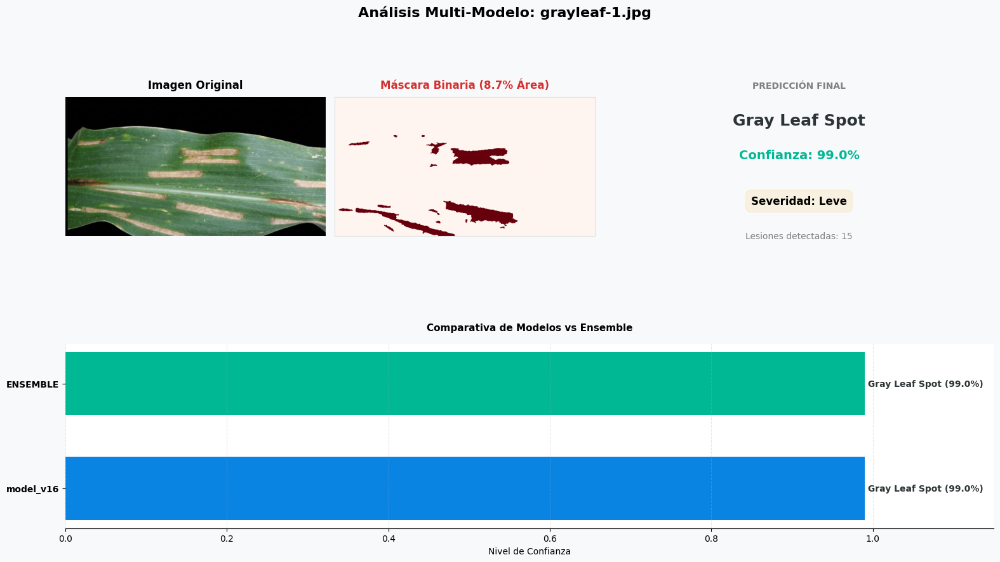


[2/54] Analizando: grayleaf-2.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (95.9%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (95.9%) ✅
  📊 Área afectada: 7.4% - Severidad: Leve


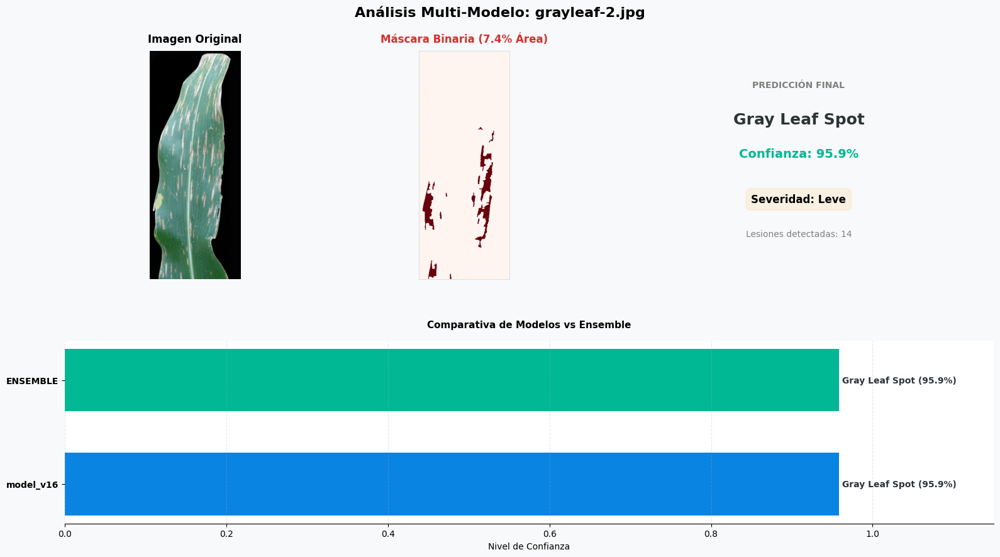


[3/54] Analizando: grayleaf3.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (79.3%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (79.3%) ✅
  📊 Área afectada: 5.4% - Severidad: Leve


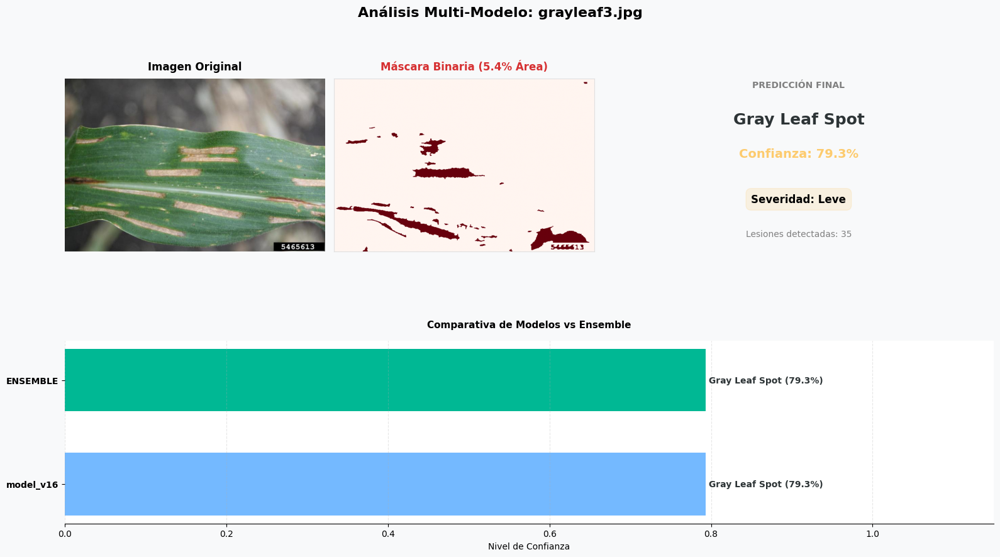


[4/54] Analizando: grayleaf4.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.1%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.1%) ✅
  📊 Área afectada: 4.5% - Severidad: Leve


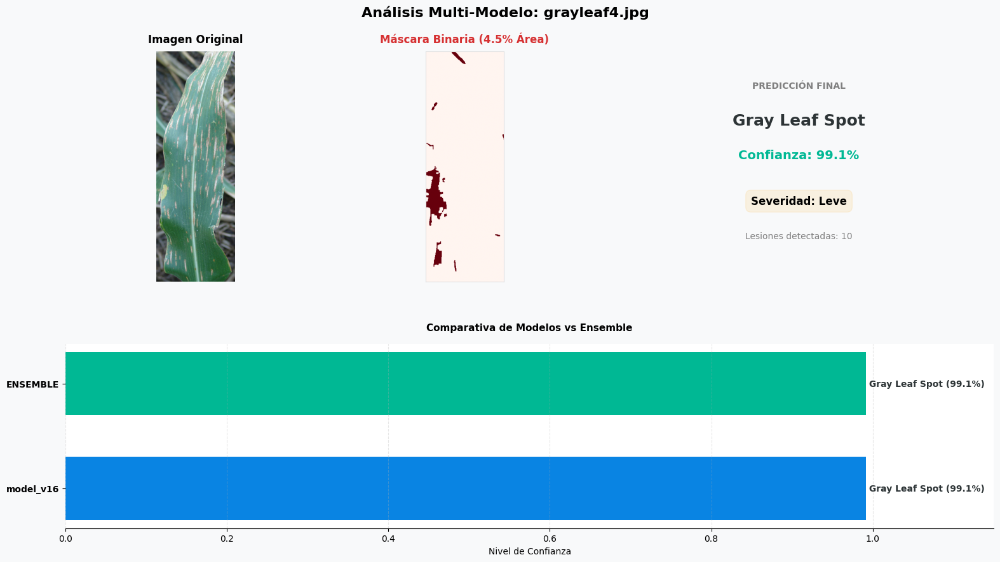


[5/54] Analizando: northern-1.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (74.6%) ❌
  🔮 Predicción Ensemble: Gray Leaf Spot (74.6%) ❌
  📊 Área afectada: 3.6% - Severidad: Leve


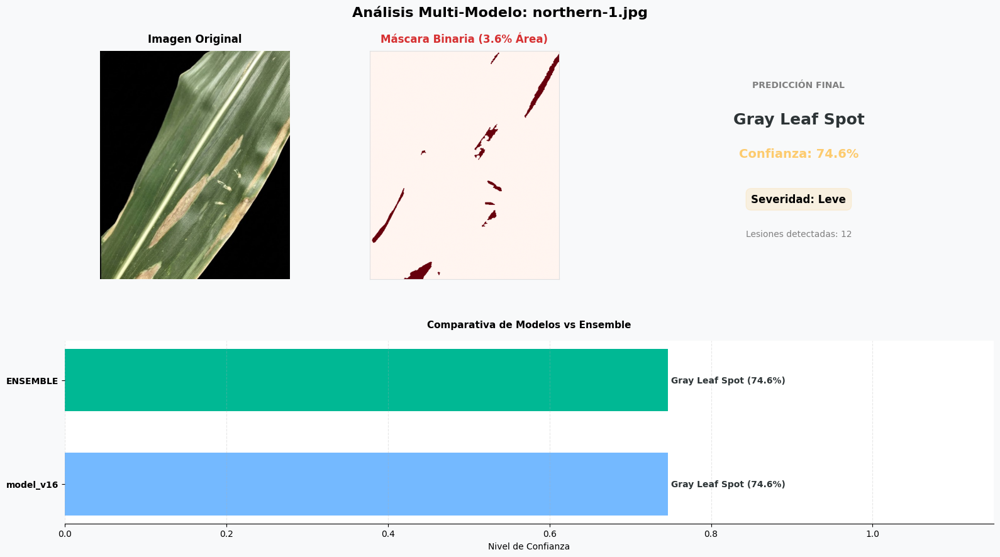


[6/54] Analizando: northern-2.png
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (98.4%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (98.4%) ✅
  📊 Área afectada: 18.9% - Severidad: Moderada


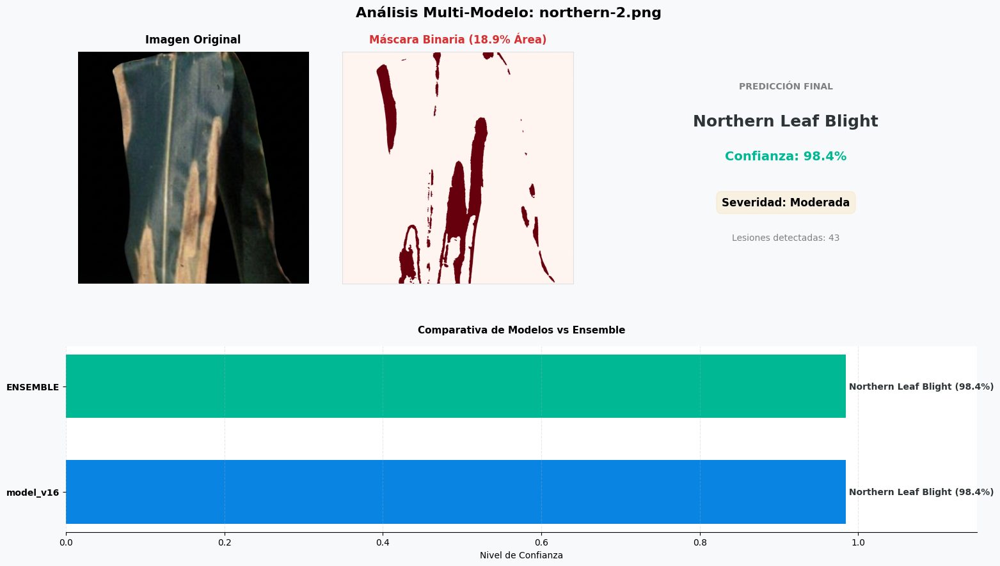


[7/54] Analizando: northern-3.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (93.0%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (93.0%) ✅
  📊 Área afectada: 25.3% - Severidad: Moderada


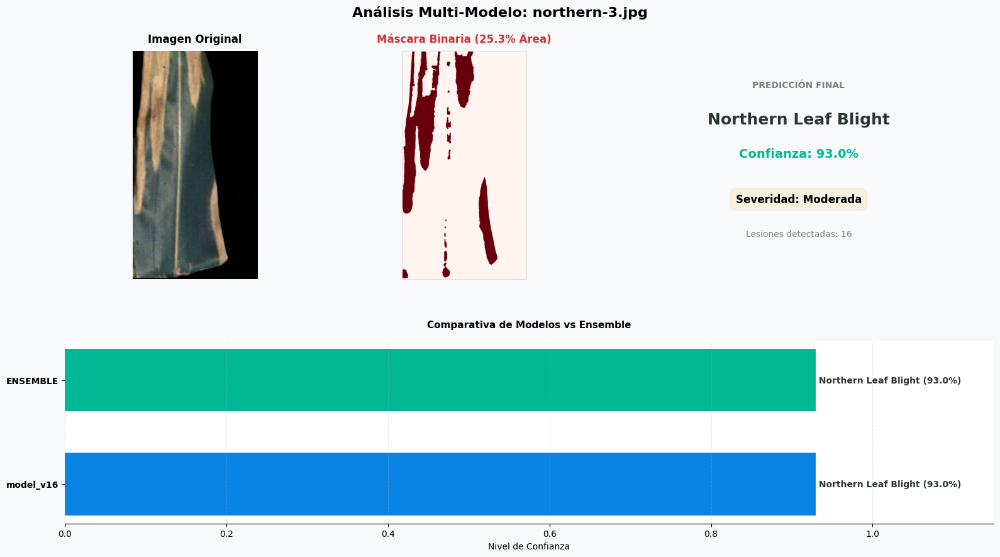


[8/54] Analizando: northern-4.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (90.7%) ❌
  🔮 Predicción Ensemble: Common Rust (90.7%) ❌
  📊 Área afectada: 7.6% - Severidad: Leve


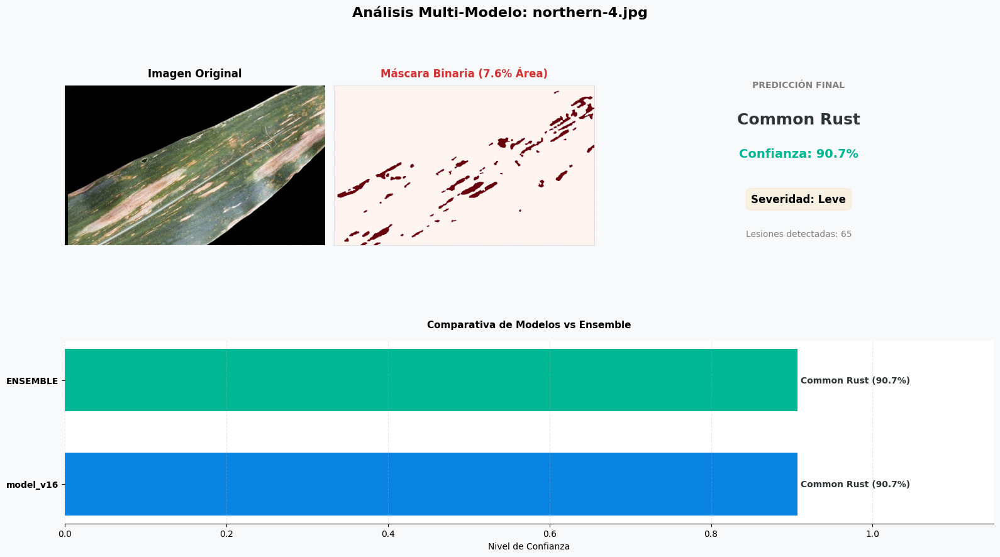


[9/54] Analizando: northern22.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (84.9%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (84.9%) ✅
  📊 Área afectada: 8.8% - Severidad: Leve


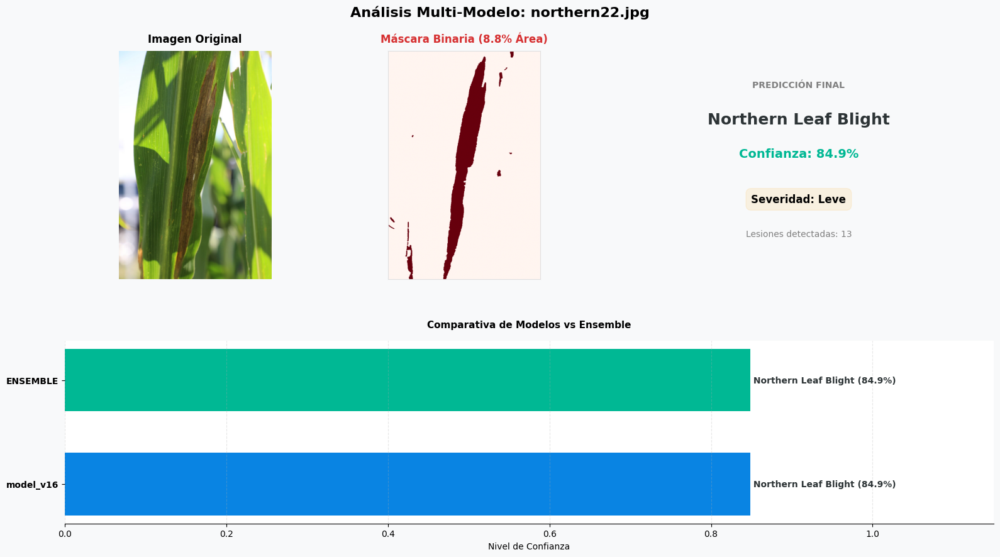


[10/54] Analizando: northern33.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (80.5%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (80.5%) ✅
  📊 Área afectada: 1.0% - Severidad: Leve


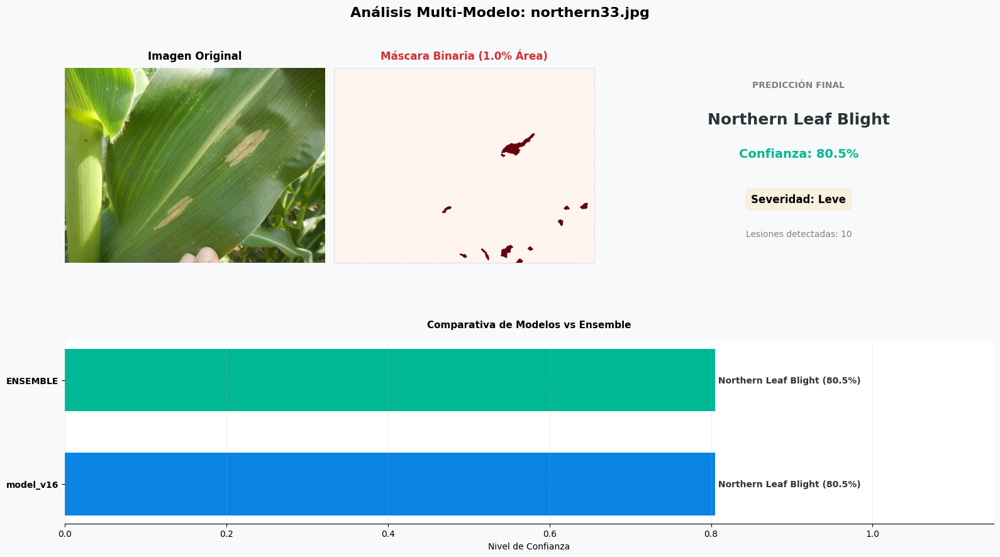


[11/54] Analizando: segmented_grayleaf-11_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (98.1%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (98.1%) ✅
  📊 Área afectada: 1.7% - Severidad: Leve


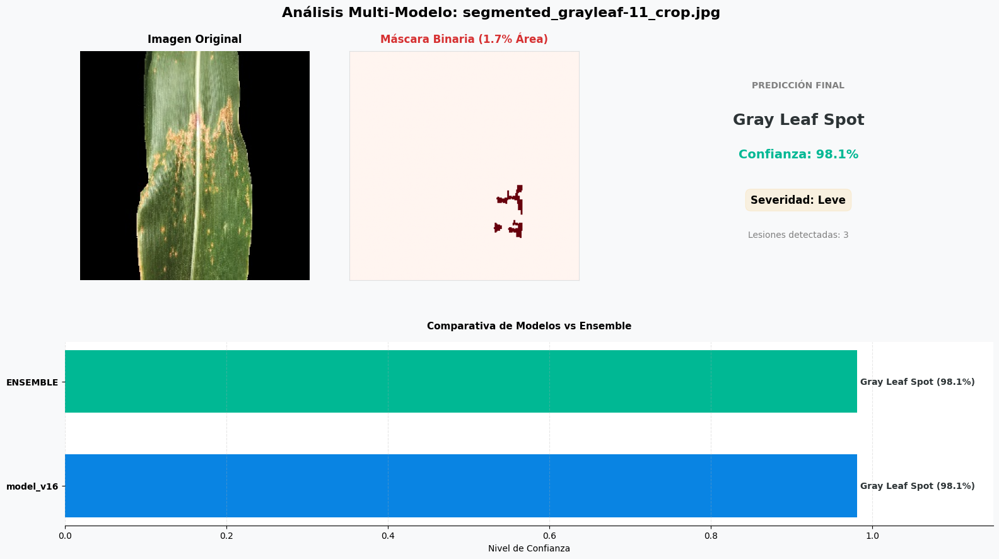


[12/54] Analizando: segmented_grayleaf12.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.7%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.7%) ✅
  📊 Área afectada: 3.0% - Severidad: Leve


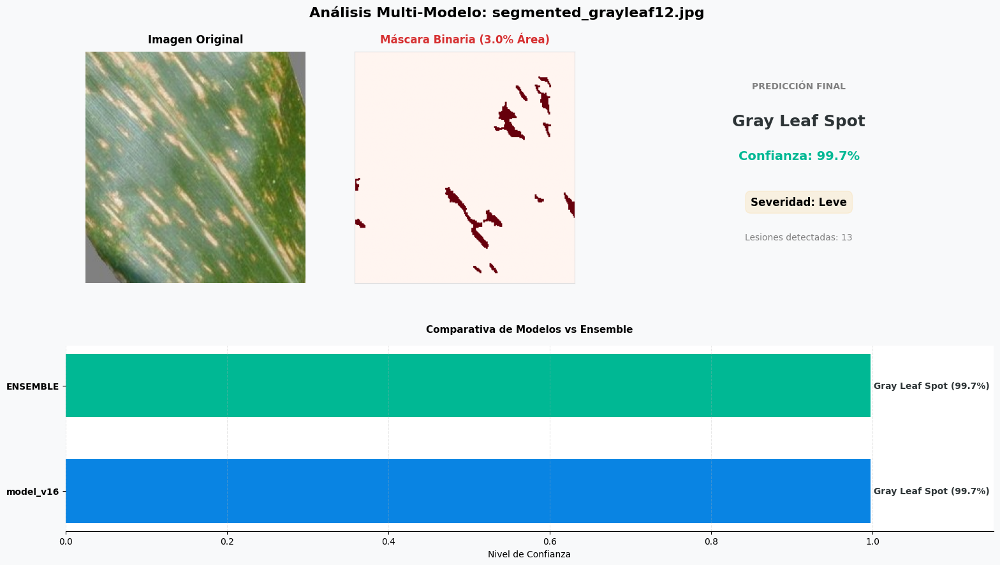


[13/54] Analizando: segmented_grayleaf17_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (87.2%) ❌
  🔮 Predicción Ensemble: Common Rust (87.2%) ❌
  📊 Área afectada: 3.6% - Severidad: Leve


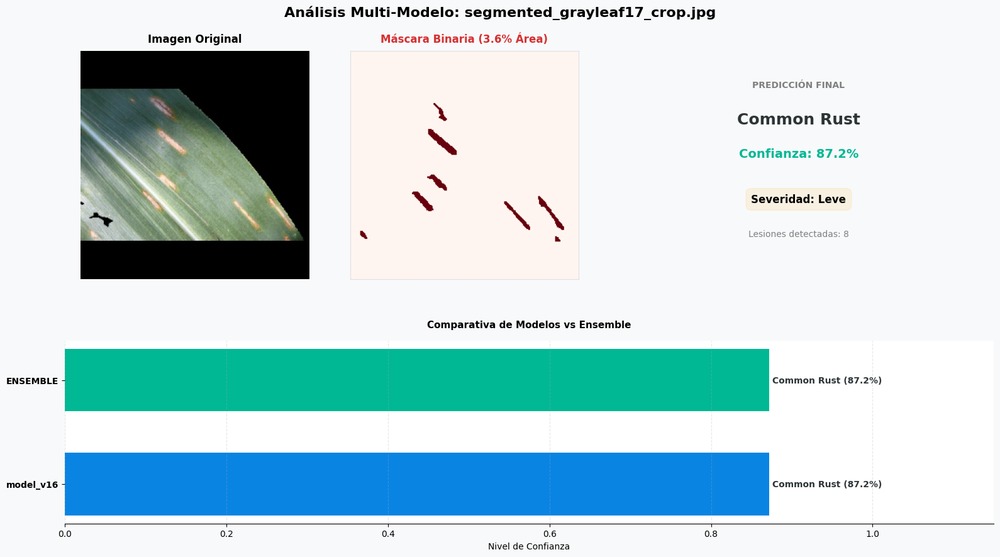


[14/54] Analizando: segmented_grayleaf18_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (99.0%) ❌
  🔮 Predicción Ensemble: Common Rust (99.0%) ❌
  📊 Área afectada: 7.4% - Severidad: Leve


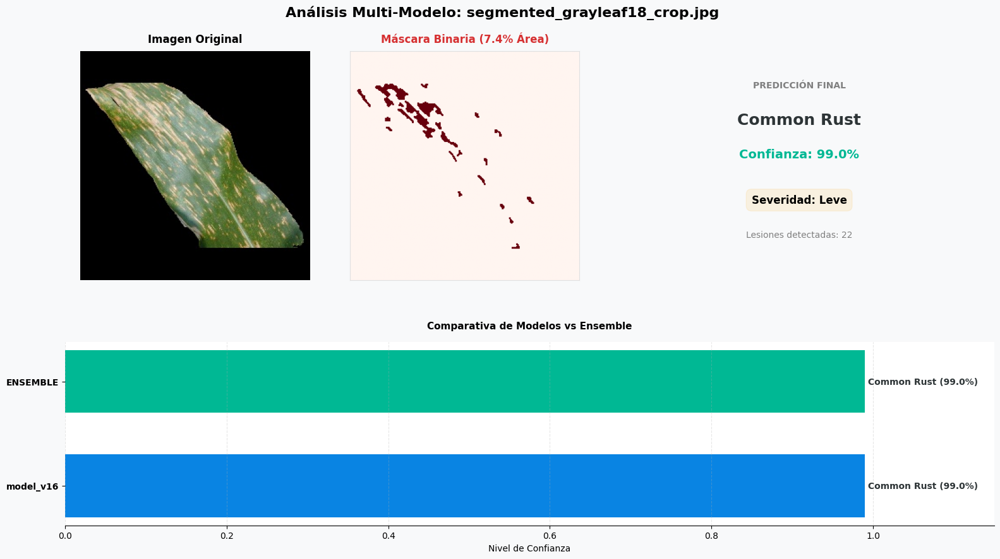


[15/54] Analizando: segmented_grayleaf1_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (96.5%) ❌
  🔮 Predicción Ensemble: Common Rust (96.5%) ❌
  📊 Área afectada: 3.5% - Severidad: Leve


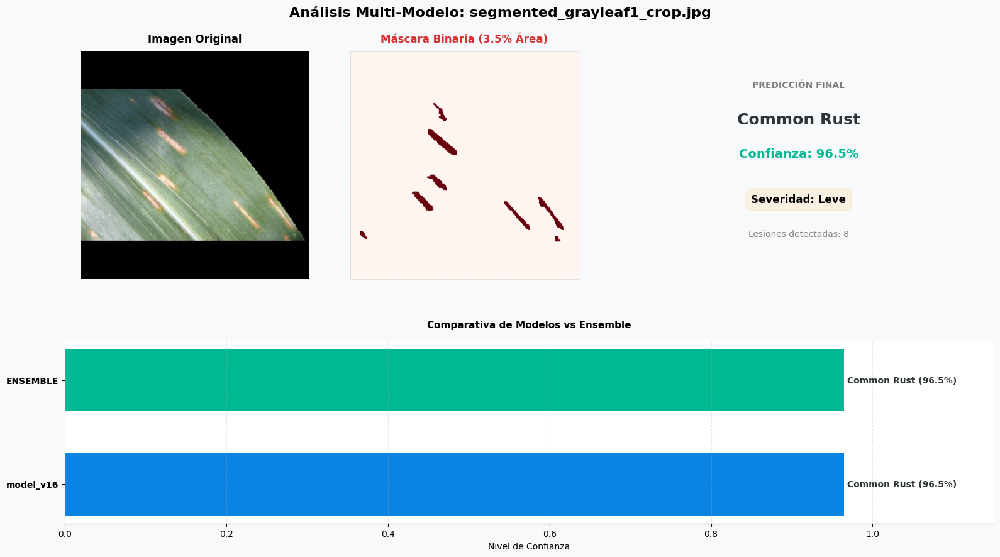


[16/54] Analizando: segmented_grayleaf2.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (82.4%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (82.4%) ✅
  📊 Área afectada: 4.6% - Severidad: Leve


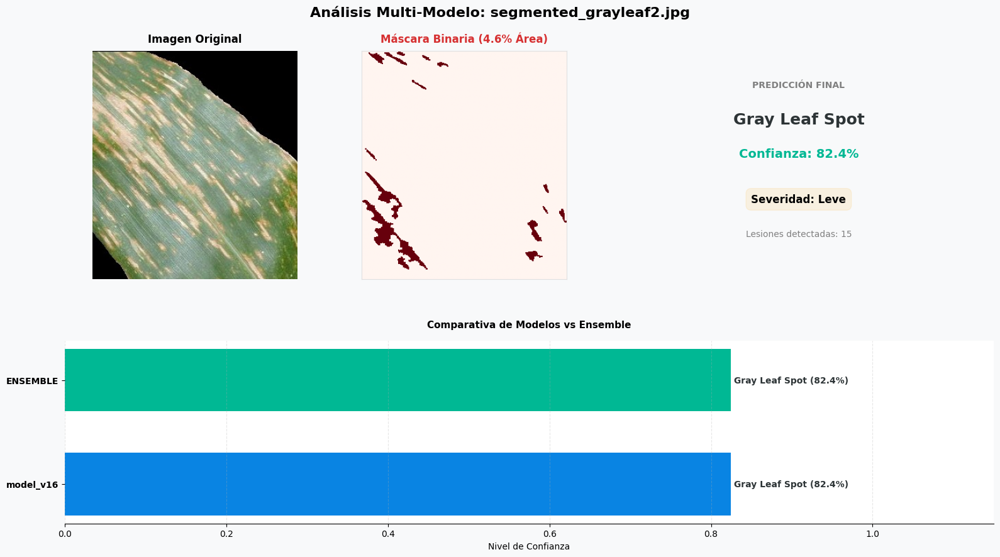


[17/54] Analizando: segmented_grayleaf2w.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.7%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.7%) ✅
  📊 Área afectada: 3.0% - Severidad: Leve


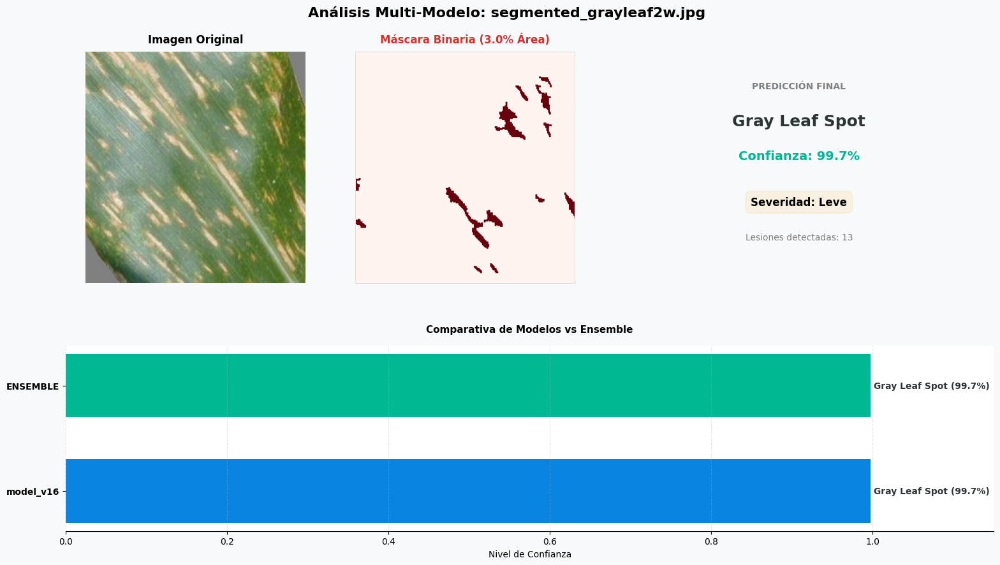


[18/54] Analizando: segmented_grayleaf4_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (68.7%) ❌
  🔮 Predicción Ensemble: Common Rust (68.7%) ❌
  📊 Área afectada: 0.0% - Severidad: Ninguna


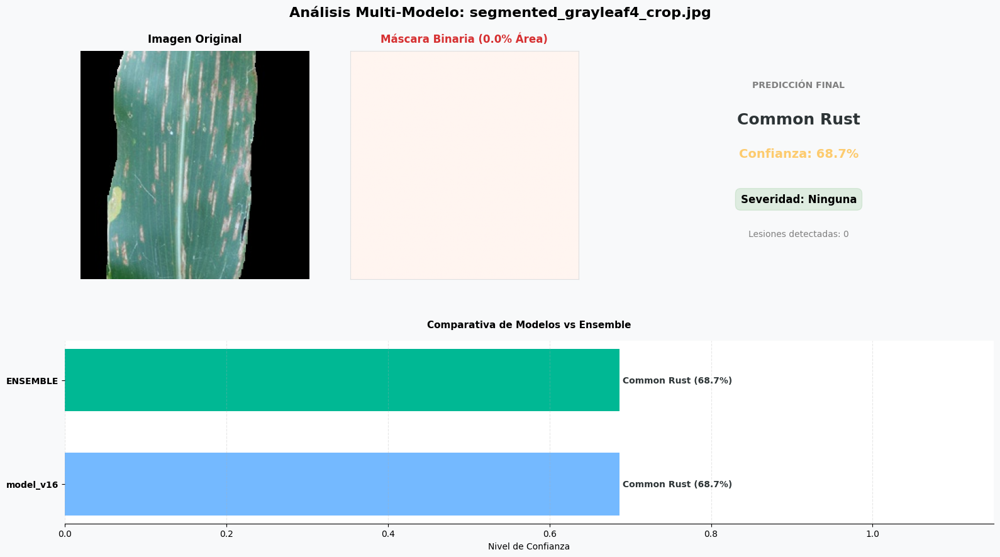


[19/54] Analizando: segmented_grayleafw.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.8%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.8%) ✅
  📊 Área afectada: 13.6% - Severidad: Moderada


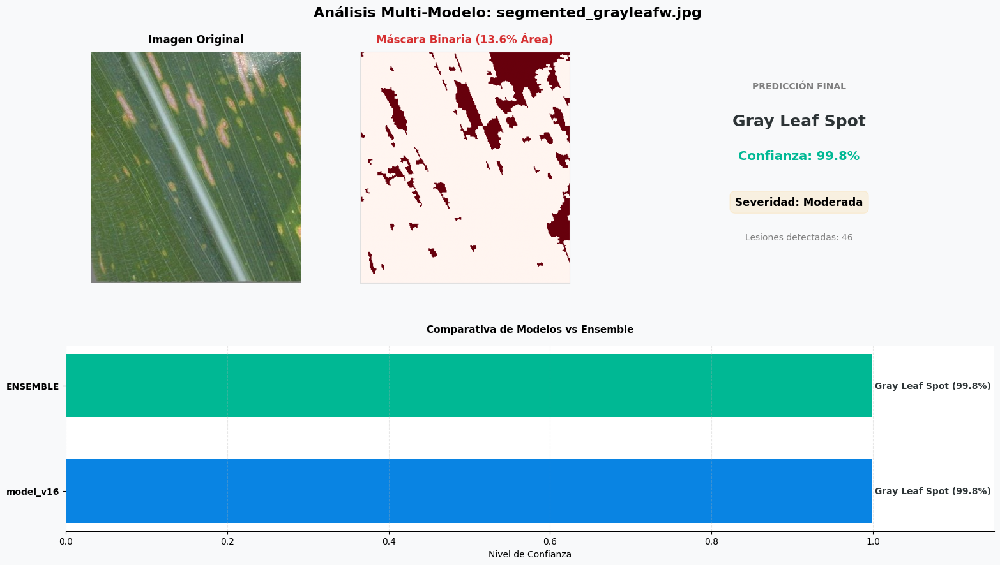


[20/54] Analizando: segmented_grayleaf_crop.jpg
----------------------------------------
  📍 Clase esperada: Gray Leaf Spot
  🤖 Predicciones de los modelos:
    • model_v16: Gray Leaf Spot (99.9%) ✅
  🔮 Predicción Ensemble: Gray Leaf Spot (99.9%) ✅
  📊 Área afectada: 30.2% - Severidad: Severa


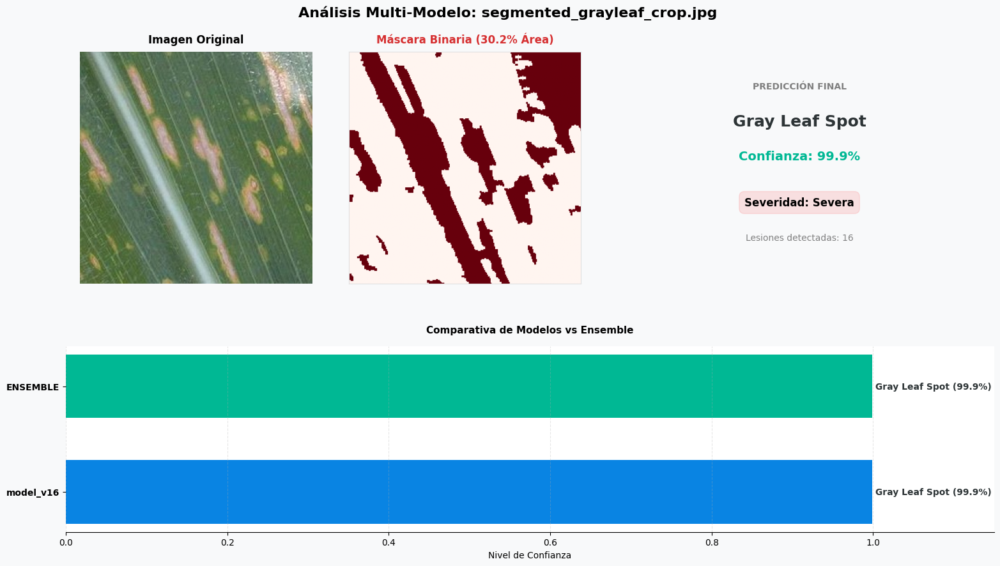


[21/54] Analizando: segmented_northern-10.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (96.0%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (96.0%) ✅
  📊 Área afectada: 50.6% - Severidad: Muy Severa


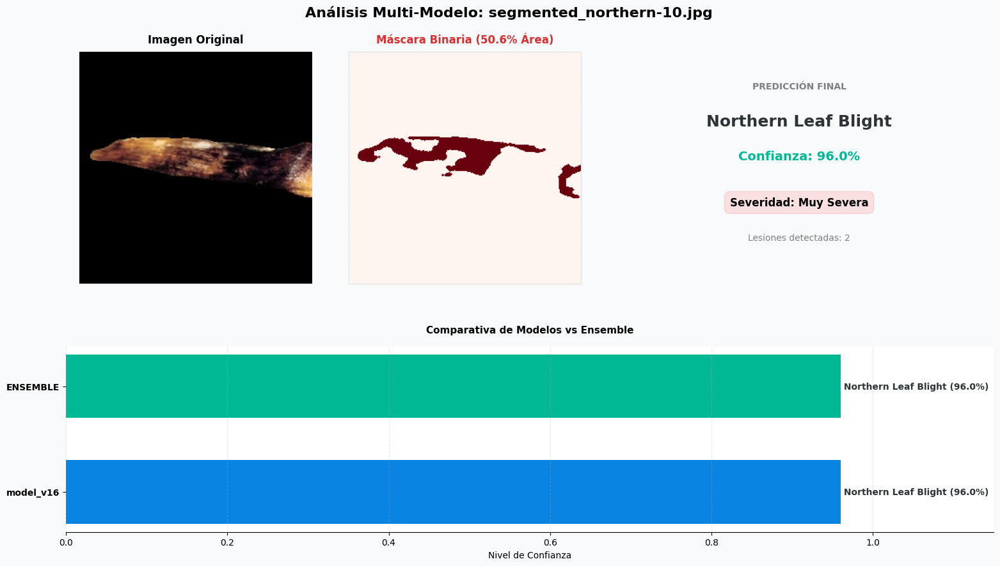


[22/54] Analizando: segmented_northern-13-_crop.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (86.3%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (86.3%) ✅
  📊 Área afectada: 49.6% - Severidad: Severa


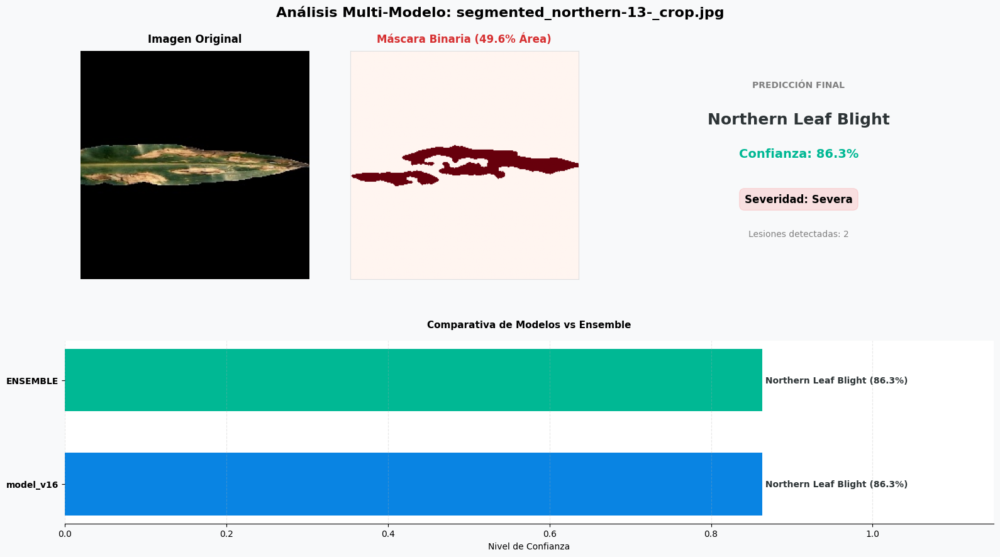


[23/54] Analizando: segmented_northern-15-_crop.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (87.6%) ❌
  🔮 Predicción Ensemble: Common Rust (87.6%) ❌
  📊 Área afectada: 10.3% - Severidad: Moderada


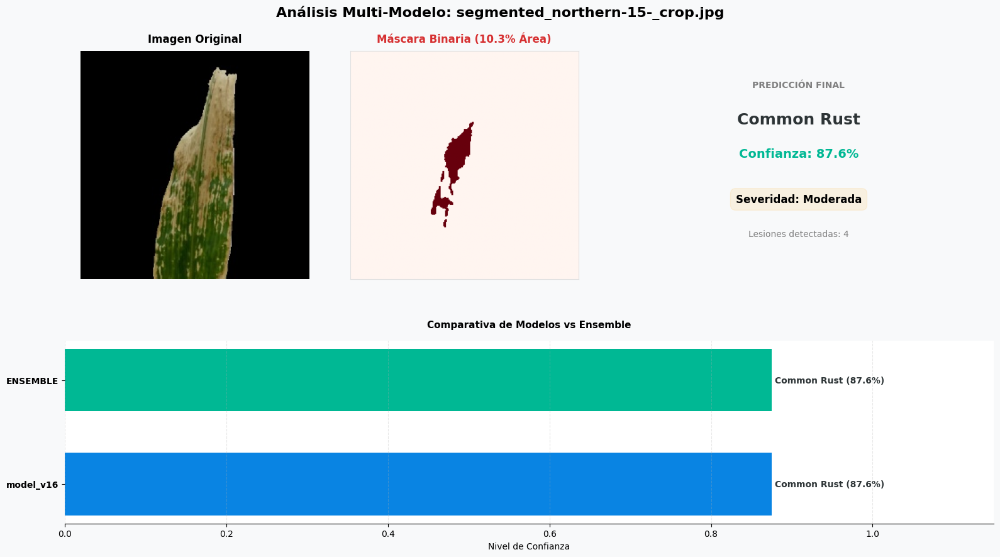


[24/54] Analizando: segmented_northern-3-_crop.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (97.1%) ❌
  🔮 Predicción Ensemble: Common Rust (97.1%) ❌
  📊 Área afectada: 20.4% - Severidad: Moderada


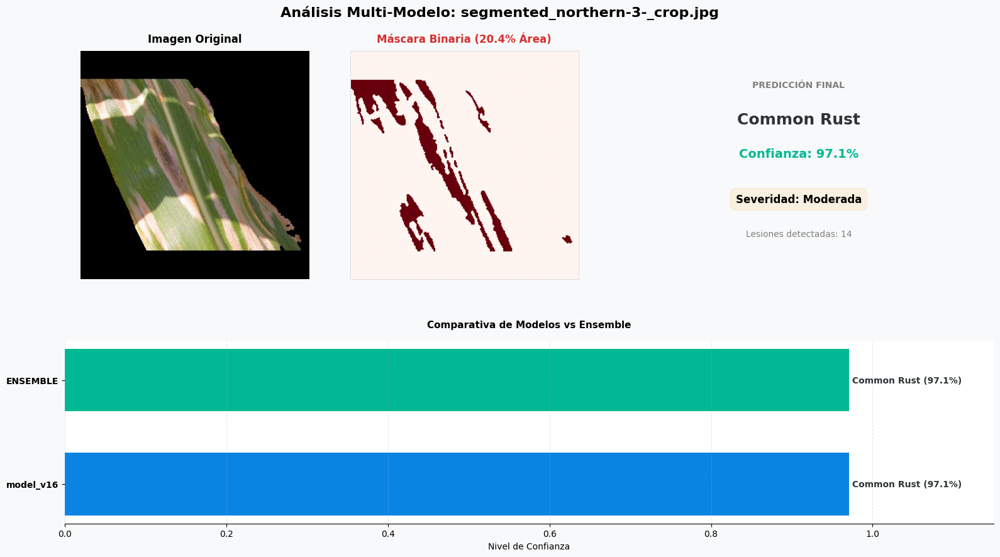


[25/54] Analizando: segmented_northern1.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (89.1%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (89.1%) ✅
  📊 Área afectada: 30.5% - Severidad: Severa


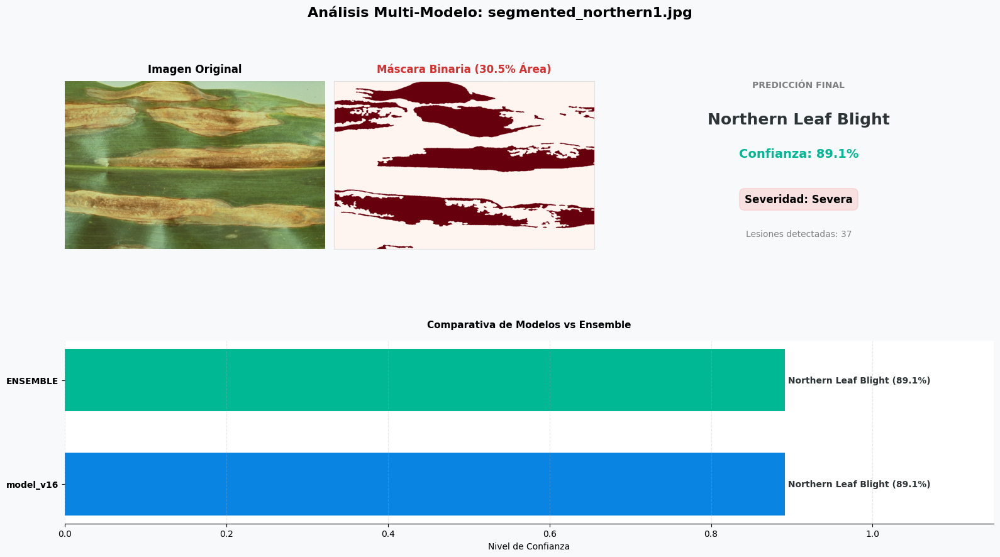


[26/54] Analizando: segmented_northern2a.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (98.7%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (98.7%) ✅
  📊 Área afectada: 8.7% - Severidad: Leve


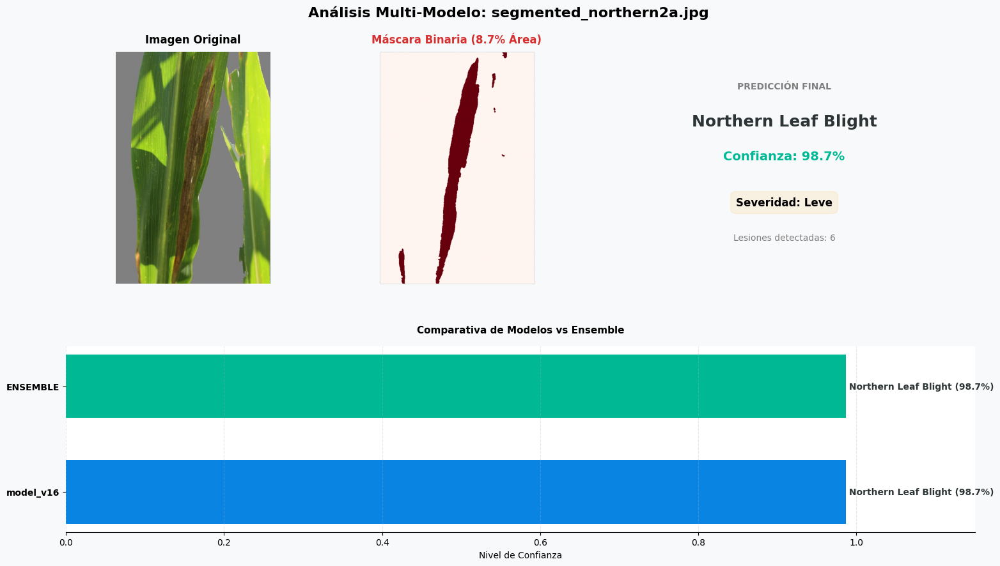


[27/54] Analizando: segmented_northern3a.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (96.5%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (96.5%) ✅
  📊 Área afectada: 0.4% - Severidad: Leve


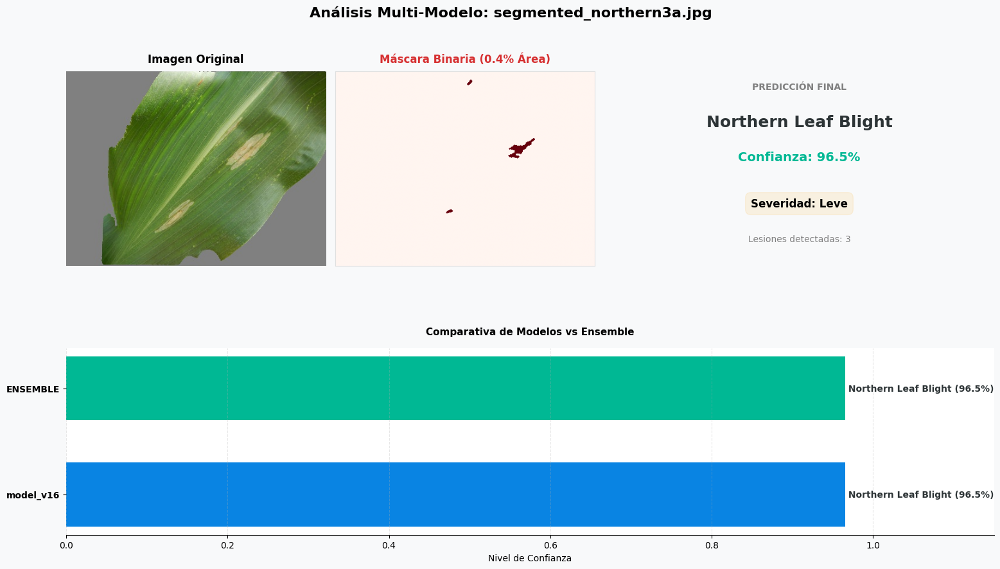


[28/54] Analizando: segmented_northern4a.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (96.5%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (96.5%) ✅
  📊 Área afectada: 18.5% - Severidad: Moderada


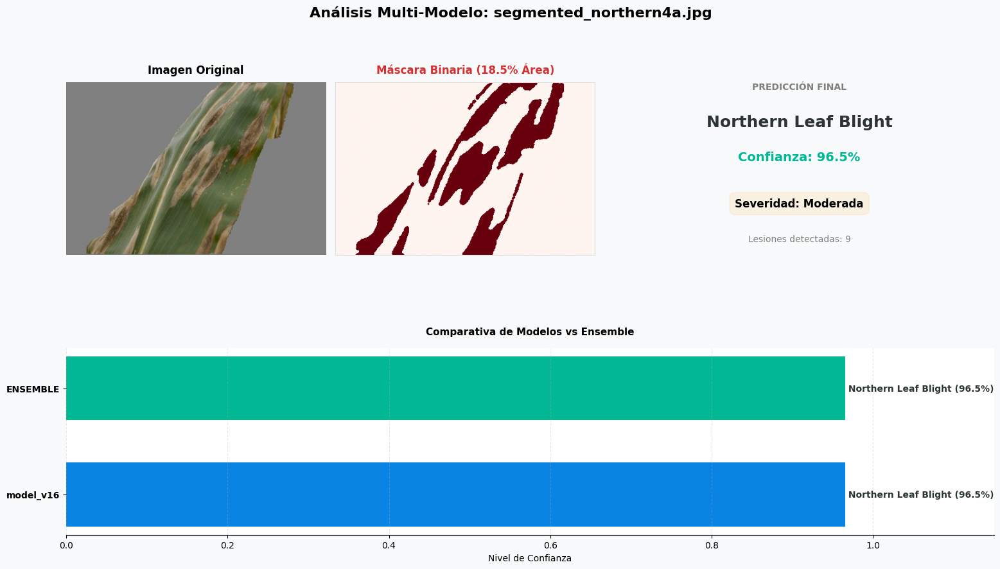


[29/54] Analizando: segmented_northerna.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (96.6%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (96.6%) ✅
  📊 Área afectada: 9.0% - Severidad: Leve


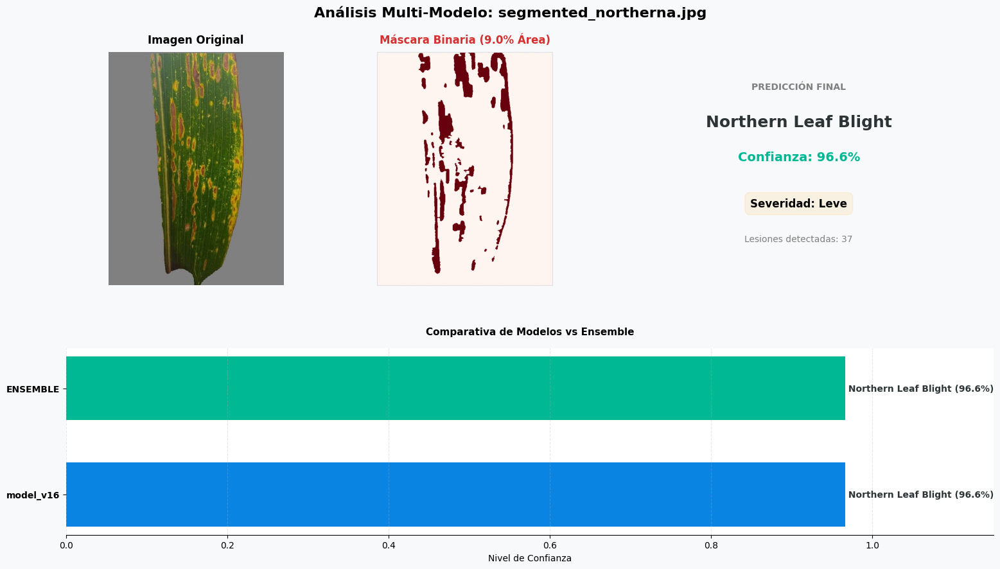


[30/54] Analizando: segmented_northern_crop.jpg
----------------------------------------
  📍 Clase esperada: Northern Leaf Blight
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (87.8%) ✅
  🔮 Predicción Ensemble: Northern Leaf Blight (87.8%) ✅
  📊 Área afectada: 6.2% - Severidad: Leve


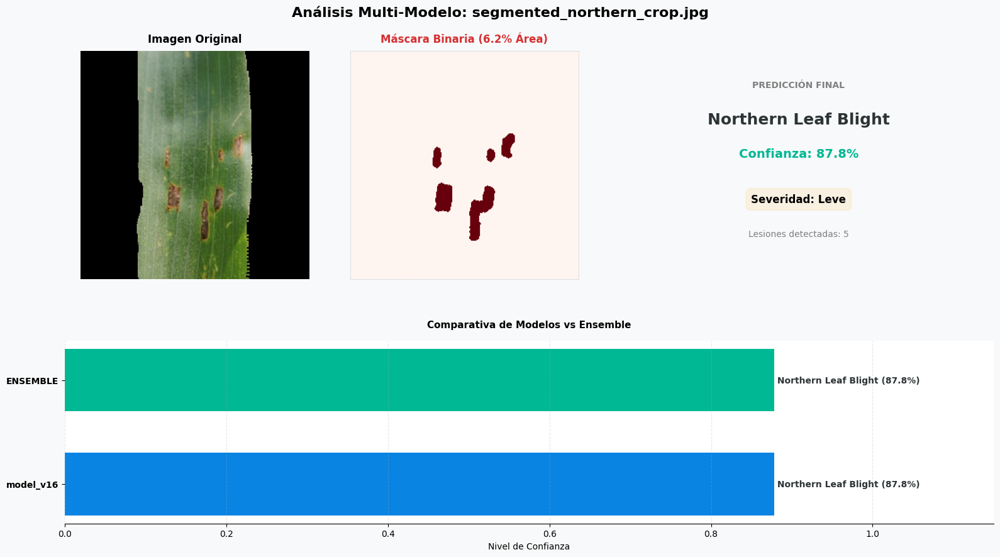


[31/54] Analizando: segmented_rust-12_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (56.9%) ✅
  🔮 Predicción Ensemble: Common Rust (56.9%) ✅
  📊 Área afectada: 1.0% - Severidad: Leve


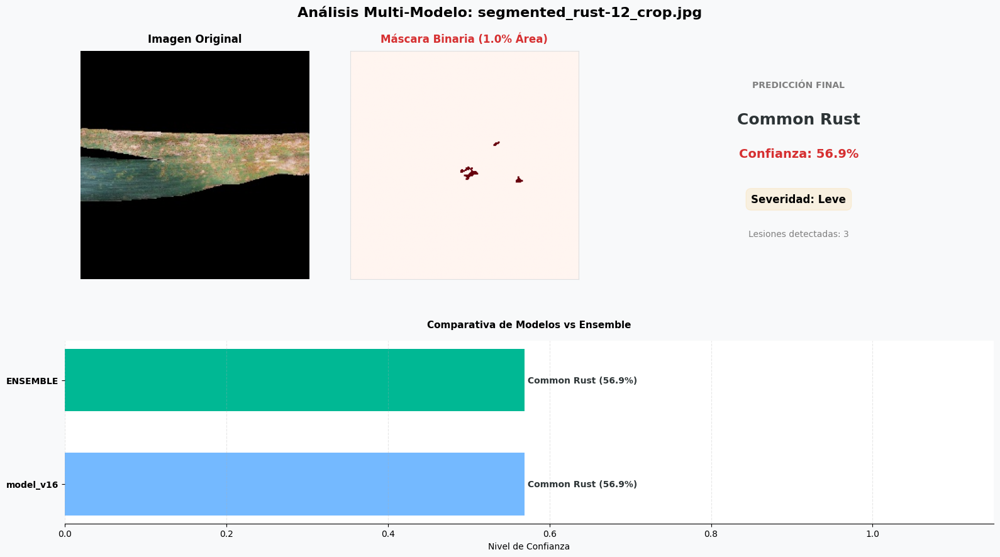


[32/54] Analizando: segmented_rust-14_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (97.1%) ✅
  🔮 Predicción Ensemble: Common Rust (97.1%) ✅
  📊 Área afectada: 4.0% - Severidad: Leve


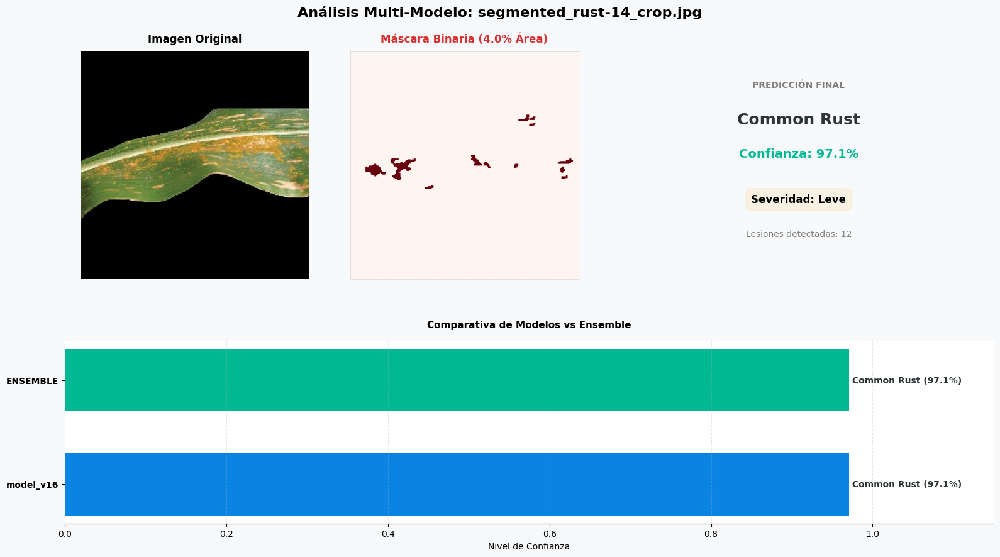


[33/54] Analizando: segmented_rust-15_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (93.2%) ✅
  🔮 Predicción Ensemble: Common Rust (93.2%) ✅
  📊 Área afectada: 24.9% - Severidad: Moderada


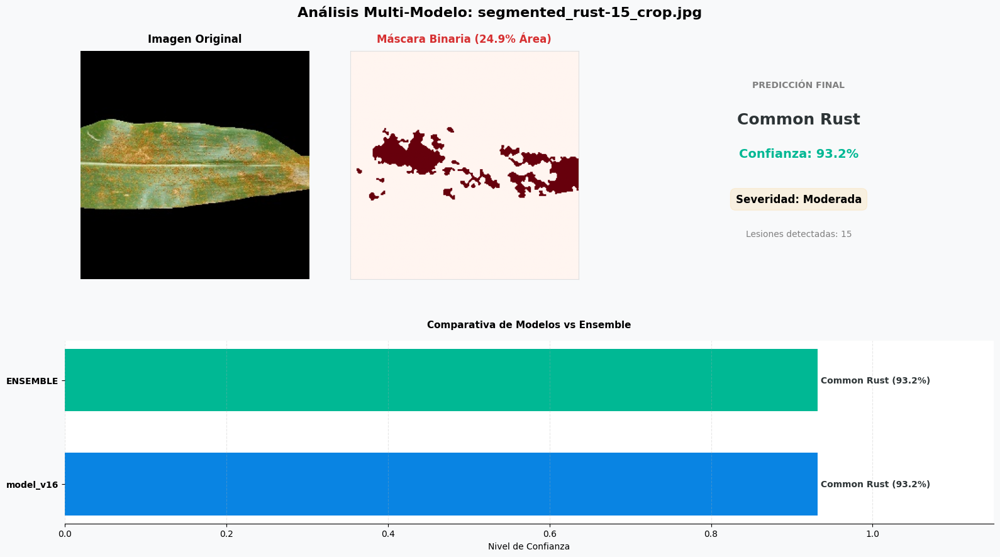


[34/54] Analizando: segmented_rust-16_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (97.3%) ✅
  🔮 Predicción Ensemble: Common Rust (97.3%) ✅
  📊 Área afectada: 11.6% - Severidad: Moderada


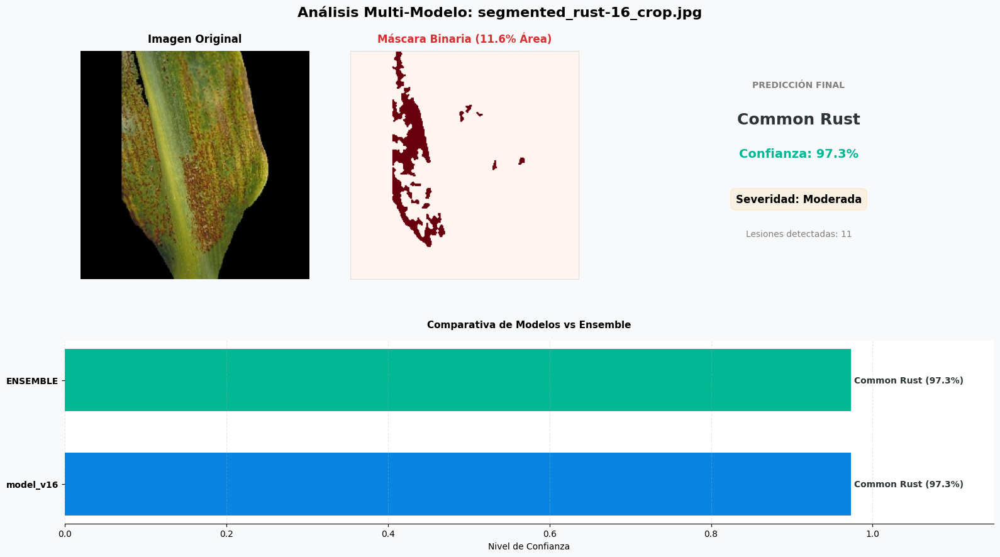


[35/54] Analizando: segmented_rust-17_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (99.4%) ✅
  🔮 Predicción Ensemble: Common Rust (99.4%) ✅
  📊 Área afectada: 4.0% - Severidad: Leve


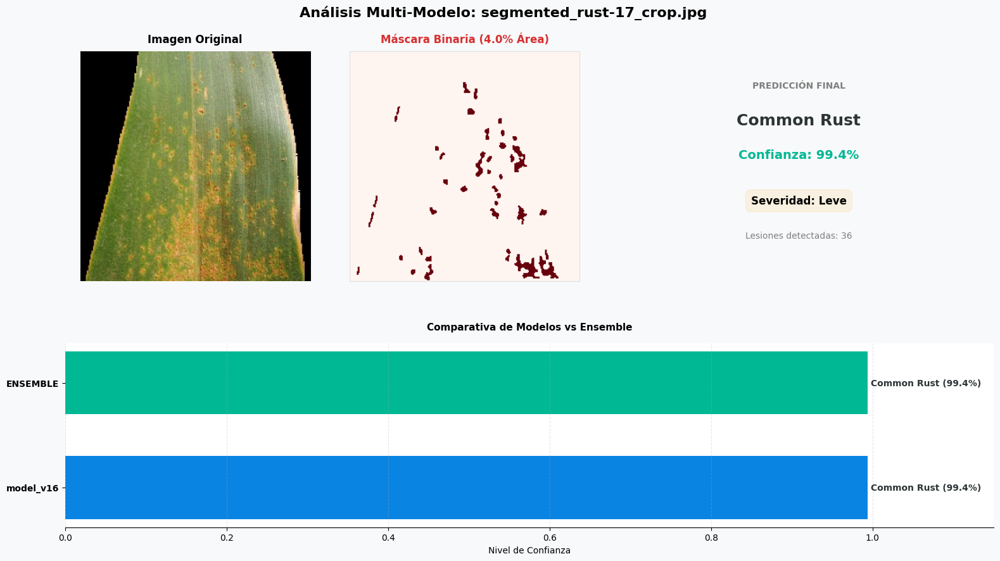


[36/54] Analizando: segmented_rust-18_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Northern Leaf Blight (91.3%) ❌
  🔮 Predicción Ensemble: Northern Leaf Blight (91.3%) ❌
  📊 Área afectada: 6.3% - Severidad: Leve


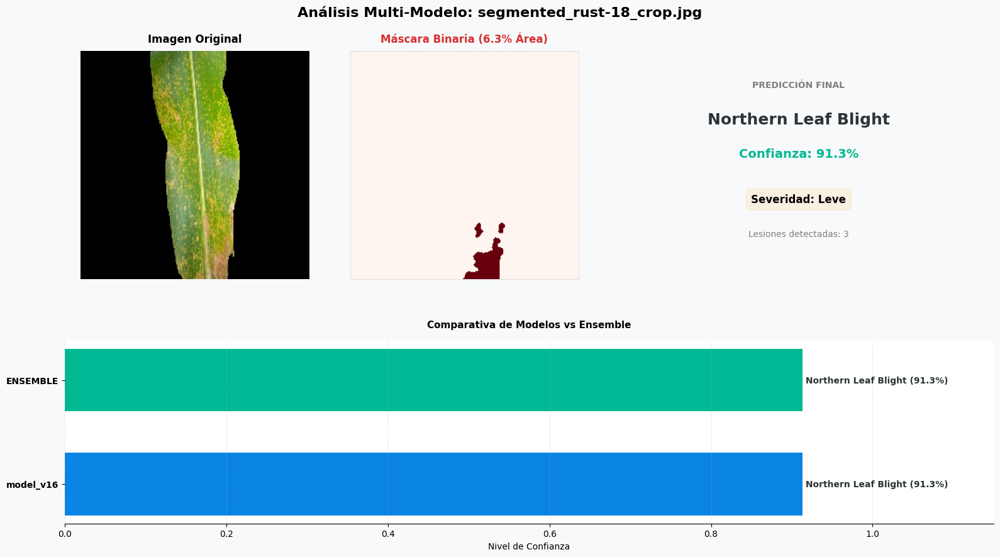


[37/54] Analizando: segmented_rust-19_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (90.3%) ✅
  🔮 Predicción Ensemble: Common Rust (90.3%) ✅
  📊 Área afectada: 4.9% - Severidad: Leve


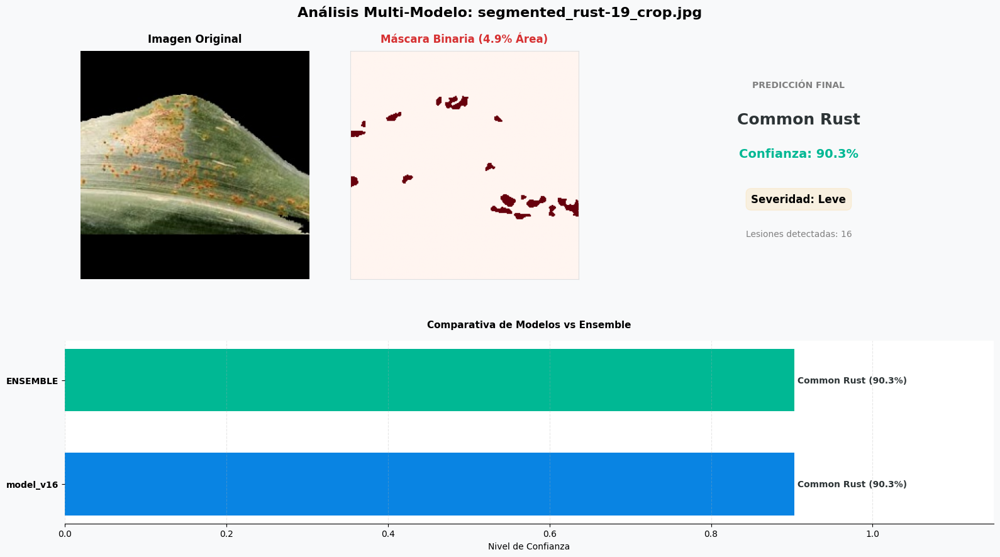


[38/54] Analizando: segmented_rust14.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (96.1%) ✅
  🔮 Predicción Ensemble: Common Rust (96.1%) ✅
  📊 Área afectada: 13.0% - Severidad: Moderada


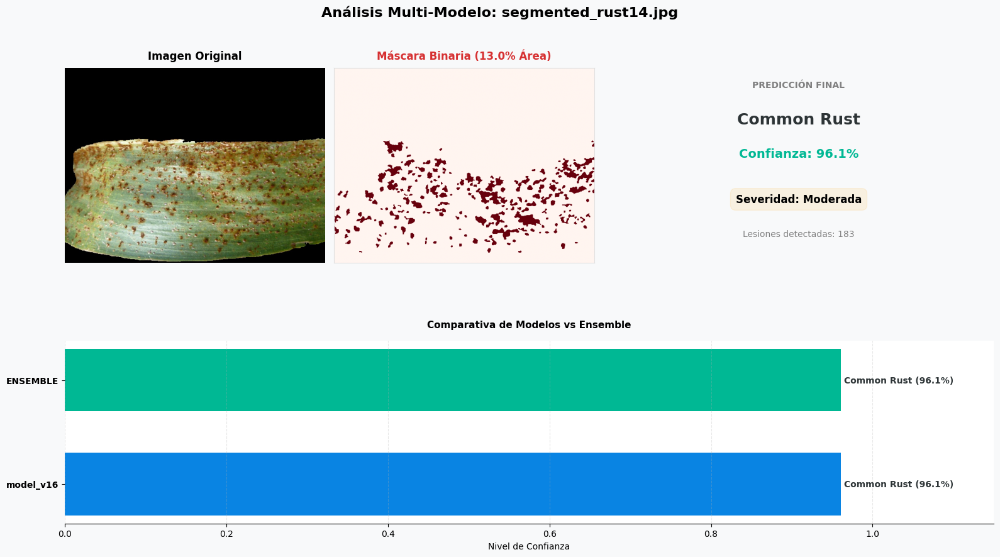


[39/54] Analizando: segmented_rust2.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (99.2%) ✅
  🔮 Predicción Ensemble: Common Rust (99.2%) ✅
  📊 Área afectada: 11.6% - Severidad: Moderada


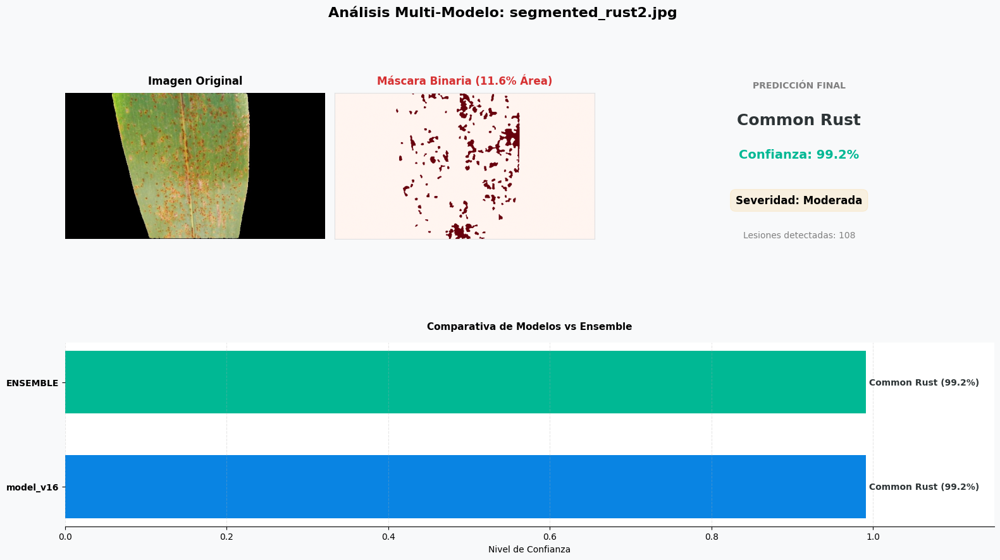


[40/54] Analizando: segmented_rust2_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (81.7%) ✅
  🔮 Predicción Ensemble: Common Rust (81.7%) ✅
  📊 Área afectada: 0.4% - Severidad: Leve


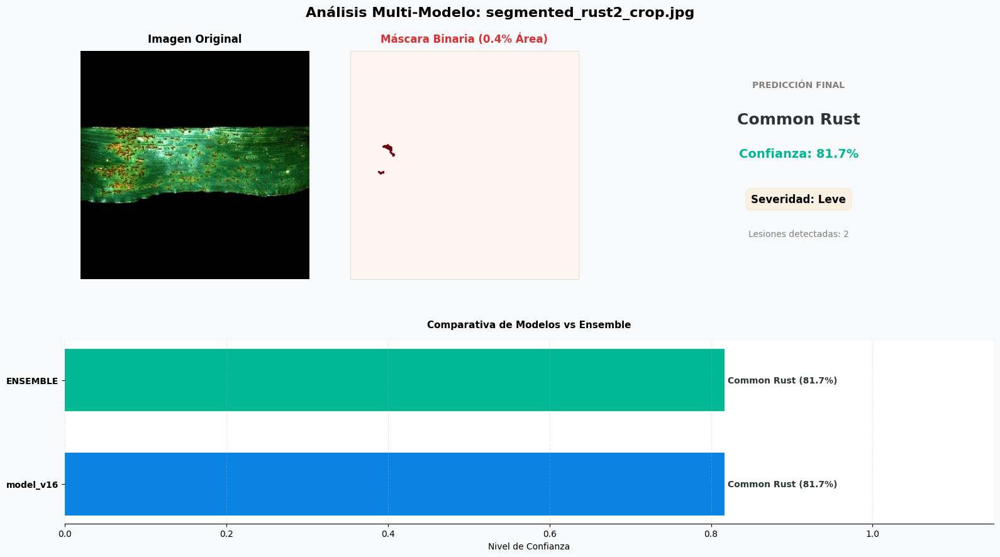


[41/54] Analizando: segmented_rust4.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (99.3%) ✅
  🔮 Predicción Ensemble: Common Rust (99.3%) ✅
  📊 Área afectada: 2.8% - Severidad: Leve


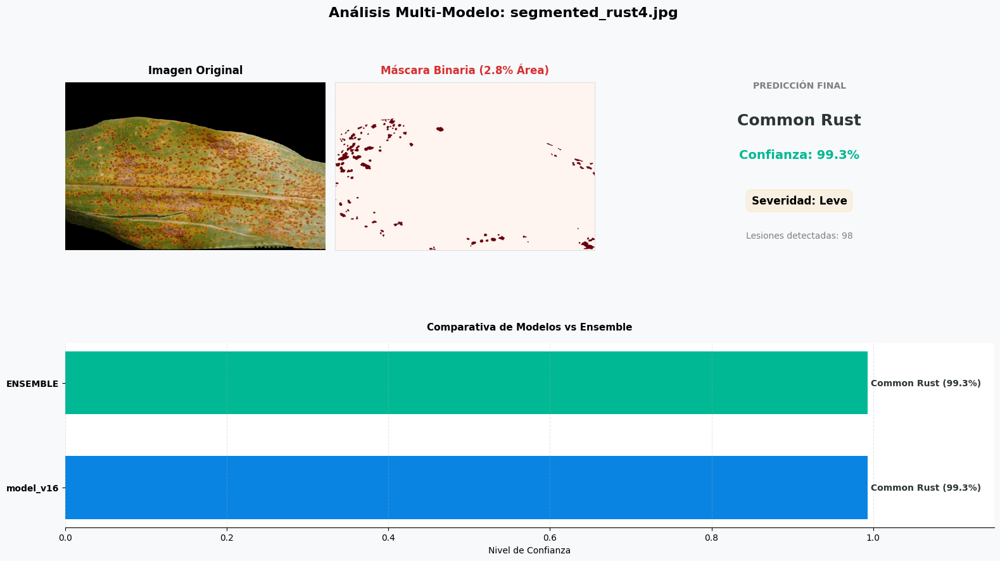


[42/54] Analizando: segmented_rust5_crop.jpg
----------------------------------------
  📍 Clase esperada: Common Rust
  🤖 Predicciones de los modelos:
    • model_v16: Common Rust (95.3%) ✅
  🔮 Predicción Ensemble: Common Rust (95.3%) ✅
  📊 Área afectada: 1.6% - Severidad: Leve


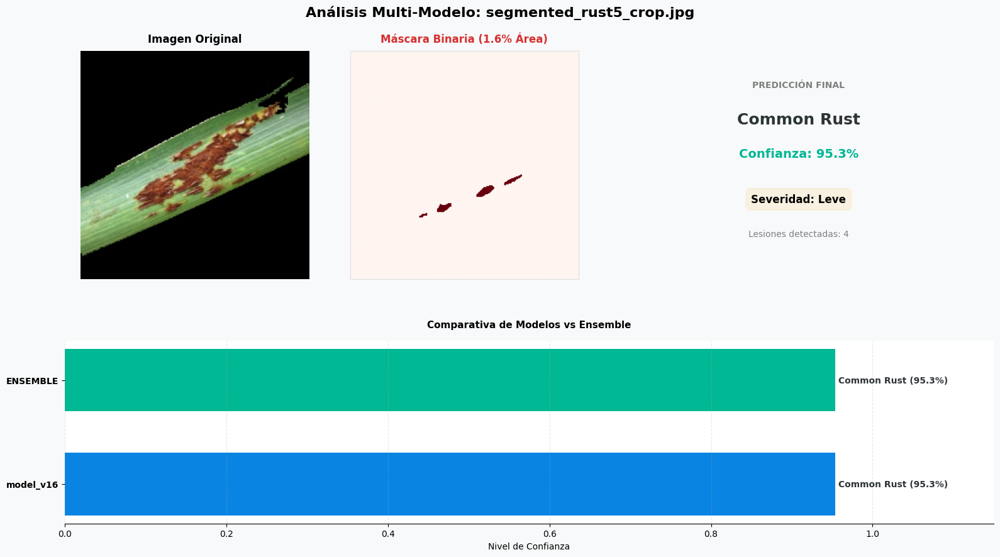


[43/54] Analizando: segmented_sana10_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (68.9%) ✅
  🔮 Predicción Ensemble: Healthy (68.9%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


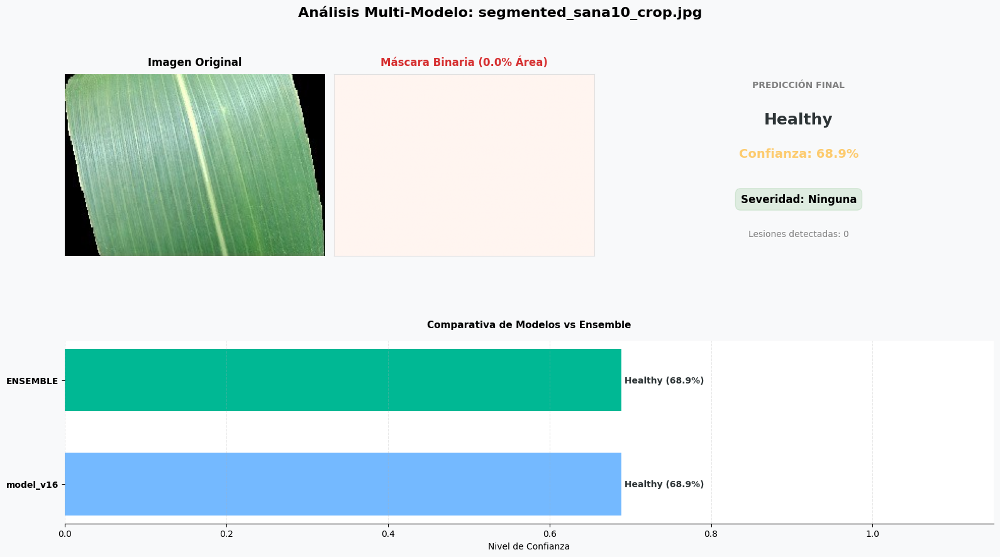


[44/54] Analizando: segmented_sana12.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (76.5%) ✅
  🔮 Predicción Ensemble: Healthy (76.5%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


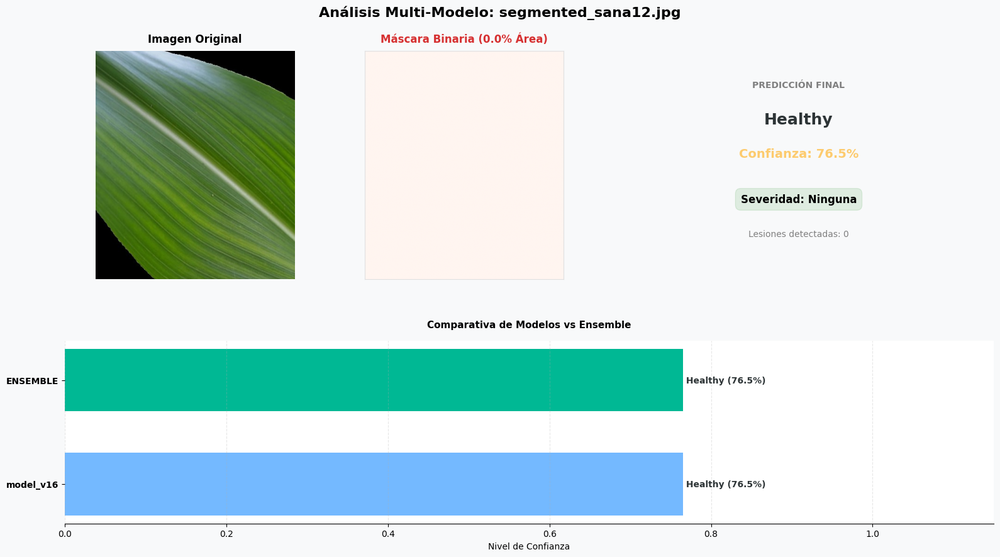


[45/54] Analizando: segmented_sana13_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (96.2%) ✅
  🔮 Predicción Ensemble: Healthy (96.2%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


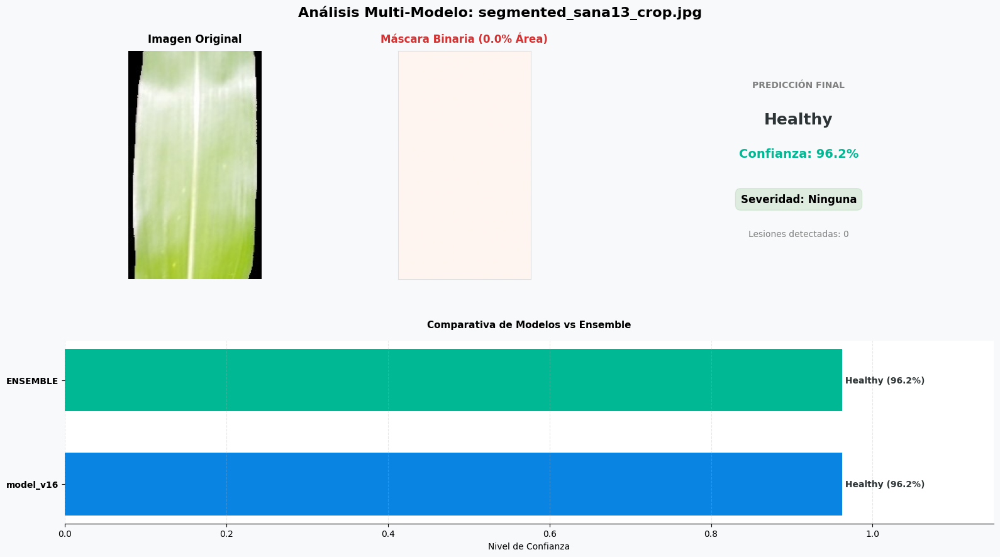


[46/54] Analizando: segmented_sana14_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (90.1%) ✅
  🔮 Predicción Ensemble: Healthy (90.1%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


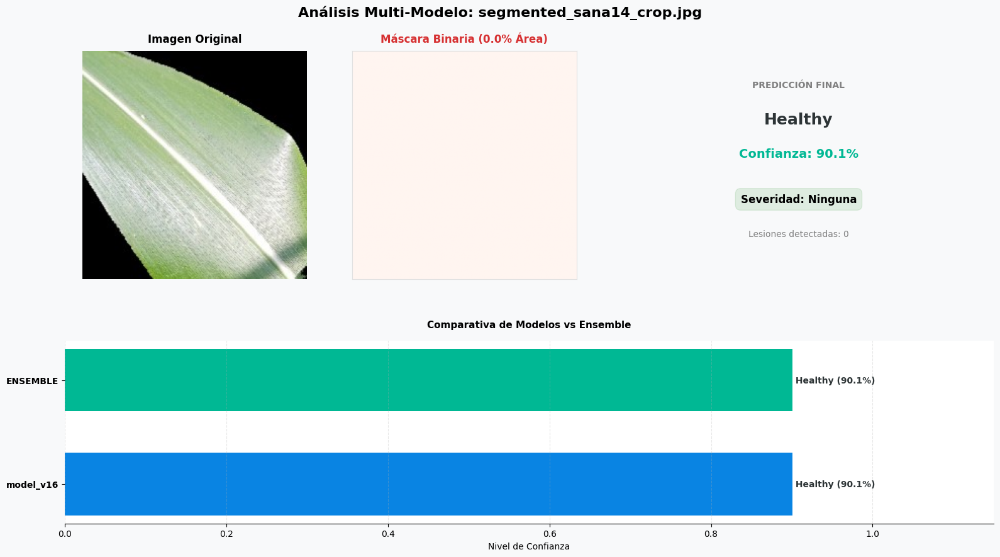


[47/54] Analizando: segmented_sana2_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (86.4%) ✅
  🔮 Predicción Ensemble: Healthy (86.4%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


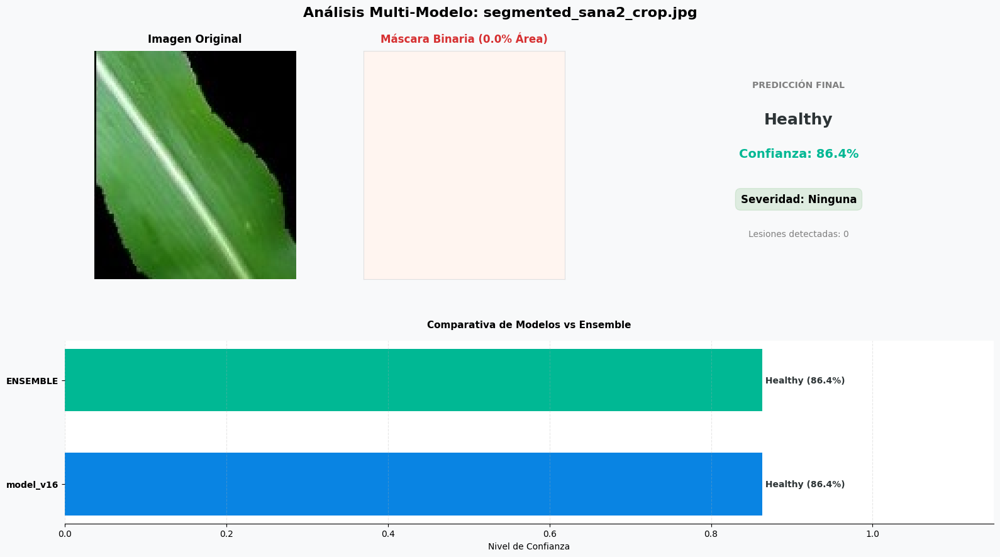


[48/54] Analizando: segmented_sana2_cropz.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (97.6%) ✅
  🔮 Predicción Ensemble: Healthy (97.6%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


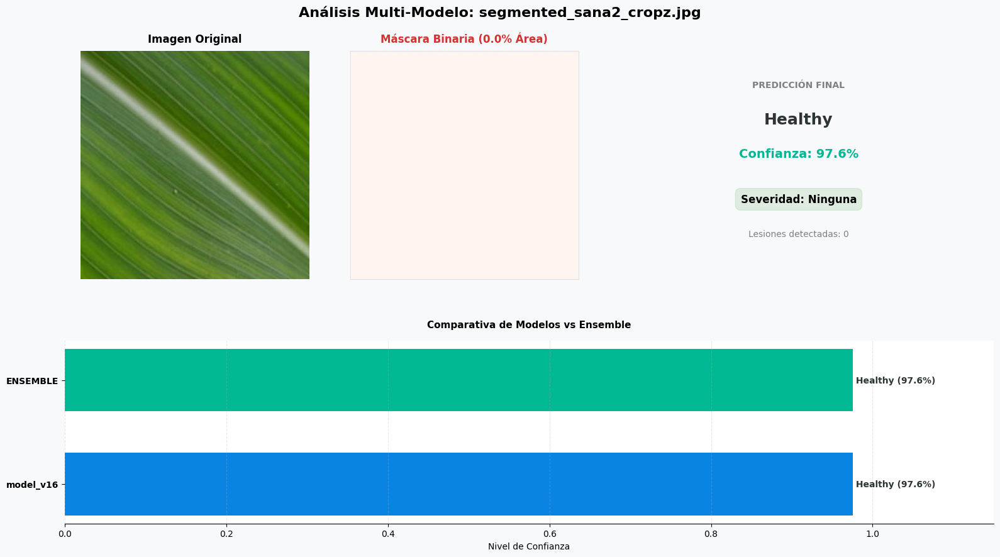


[49/54] Analizando: segmented_sana3_cropz.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (77.3%) ✅
  🔮 Predicción Ensemble: Healthy (77.3%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


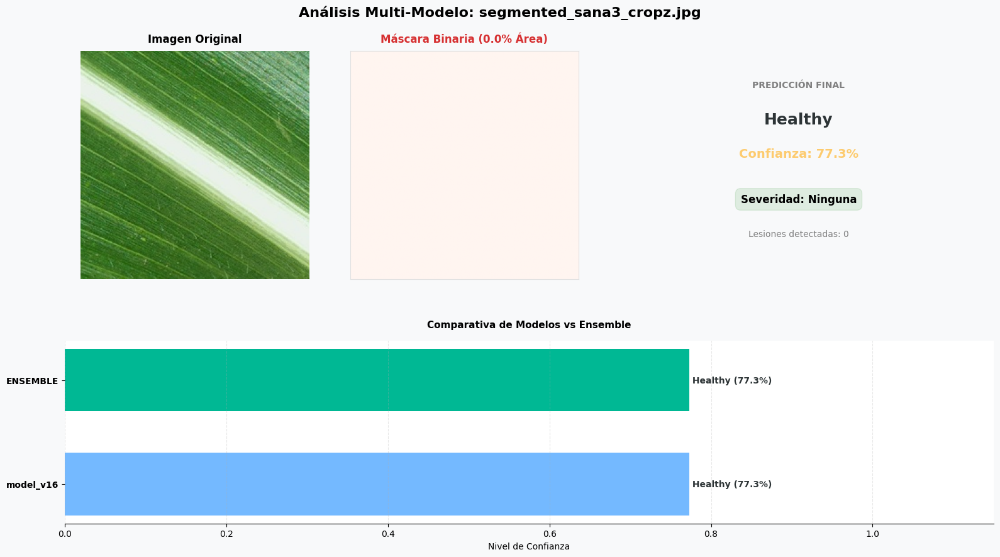


[50/54] Analizando: segmented_sana4_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (98.9%) ✅
  🔮 Predicción Ensemble: Healthy (98.9%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


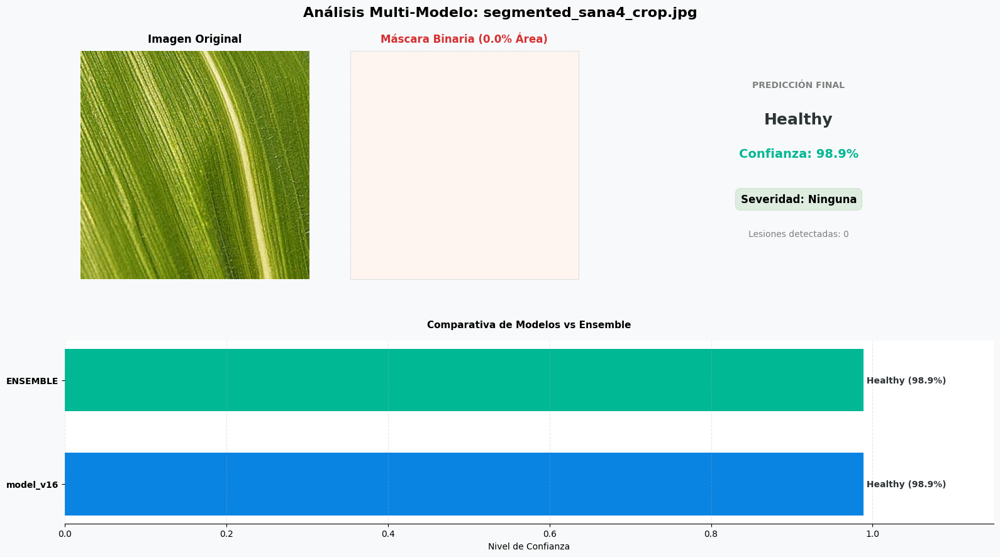


[51/54] Analizando: segmented_sana4_cropz.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (98.9%) ✅
  🔮 Predicción Ensemble: Healthy (98.9%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


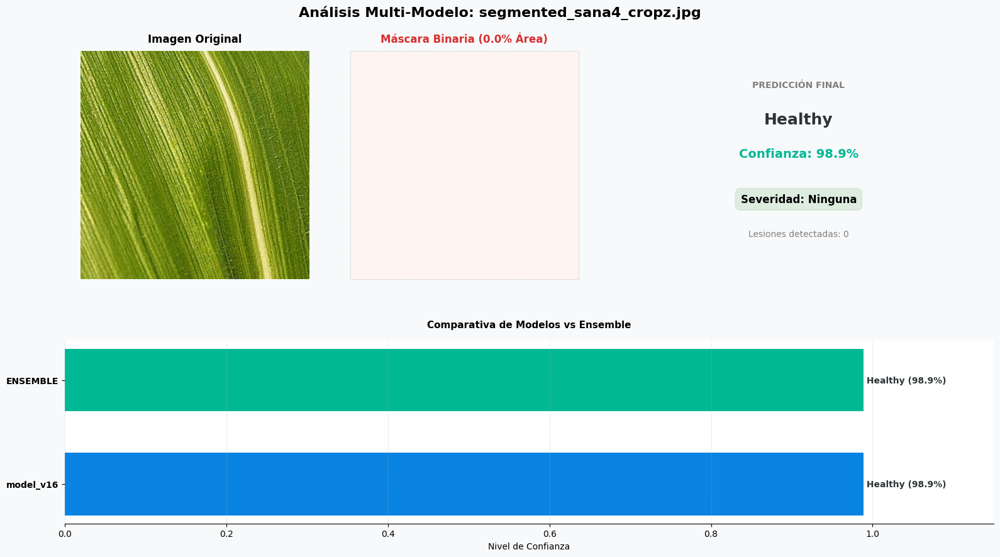


[52/54] Analizando: segmented_sana5_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (80.0%) ✅
  🔮 Predicción Ensemble: Healthy (80.0%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


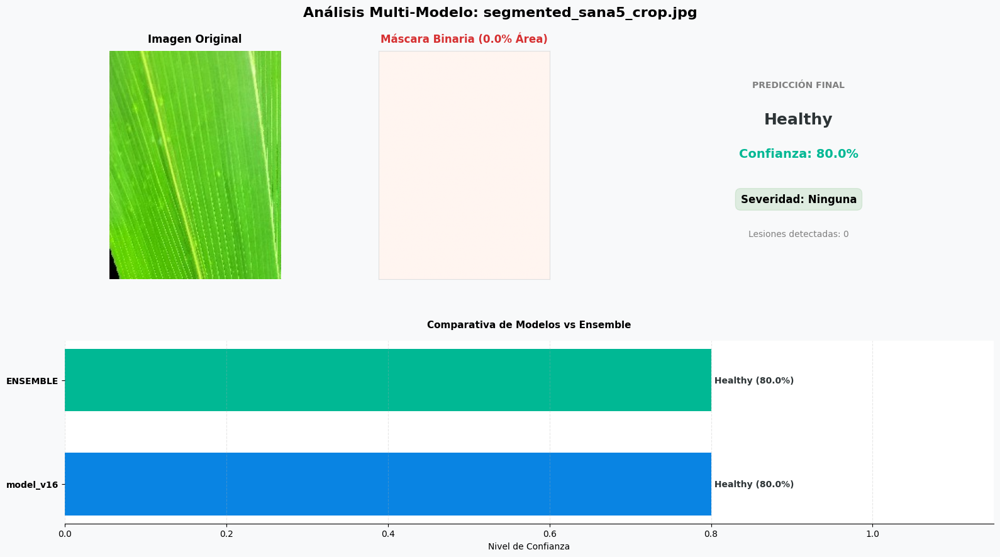


[53/54] Analizando: segmented_sana8_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (82.5%) ✅
  🔮 Predicción Ensemble: Healthy (82.5%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


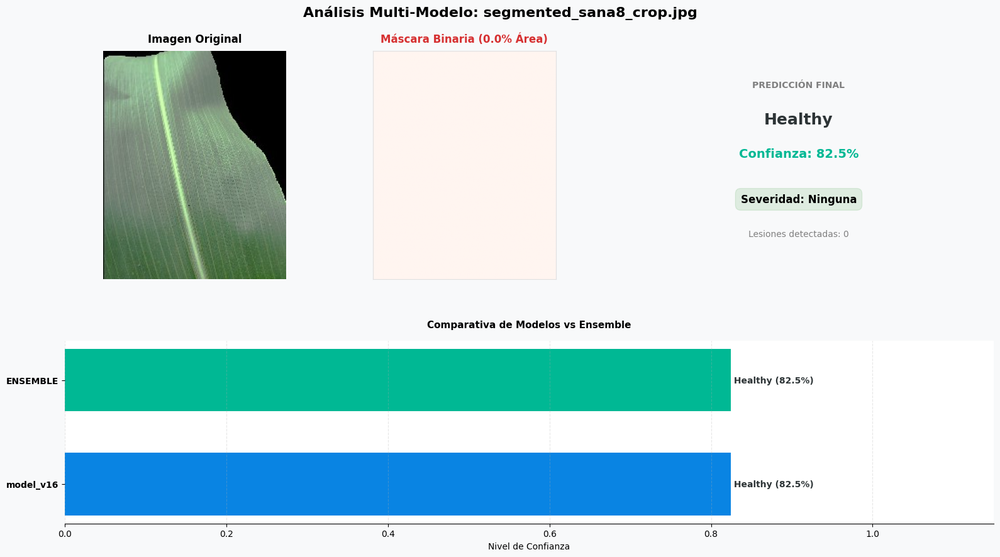


[54/54] Analizando: segmented_sana9_crop.jpg
----------------------------------------
  📍 Clase esperada: Healthy
  🤖 Predicciones de los modelos:
    • model_v16: Healthy (82.3%) ✅
  🔮 Predicción Ensemble: Healthy (82.3%) ✅
  📊 Área afectada: 0.0% - Severidad: Ninguna


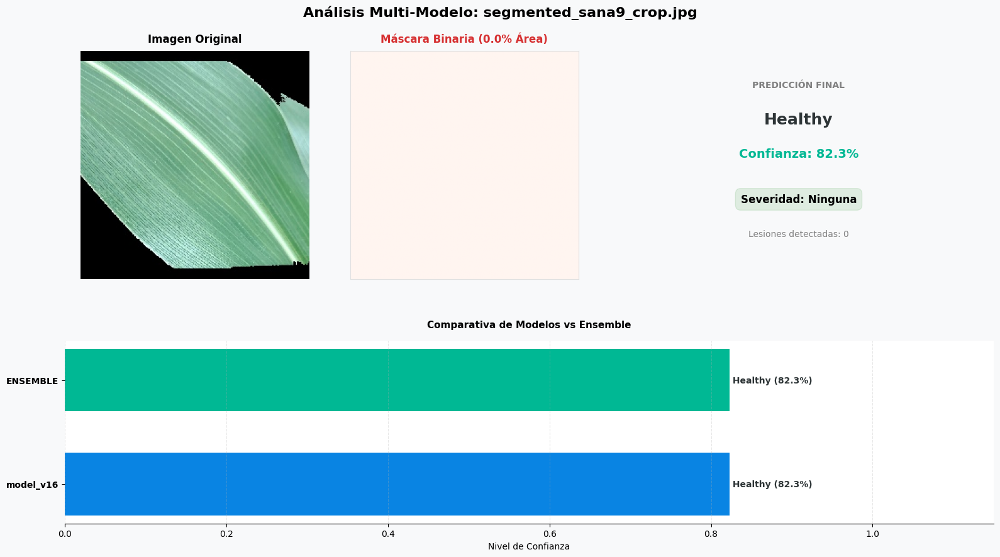


📊 RESUMEN DE EVALUACIÓN

🎯 PRECISIÓN POR MODELO:
----------------------------------------
  • model_v16: 45/54 (83.3% de precisión)

🔮 PRECISIÓN DEL ENSEMBLE: 45/54 (83.3%)

🏆 MEJOR MODELO: model_v16 (83.3% de precisión)

📋 MATRIZ DE CONFUSIÓN (Ensemble):
----------------------------------------

                         PREDICCIONES
           Northern L  Gray Leaf   Common Rus   Healthy   
REAL      ------------------------------------------------
Northern Leaf B |     12          1           3           0      
Gray Leaf Spot  |     0           10          4           0      
Common Rust     |     1           0           11          0      
Healthy         |     0           0           0           12     

📁 Reporte CSV guardado en: disease_analysis_results\multi_model_analysis_20251212_091225.csv
📁 Reporte JSON guardado en: disease_analysis_results\multi_model_analysis_20251212_091225.json

✅ Análisis multi-modelo completado exitosamente

📊 Gráfico de precisión guardado: disease_a

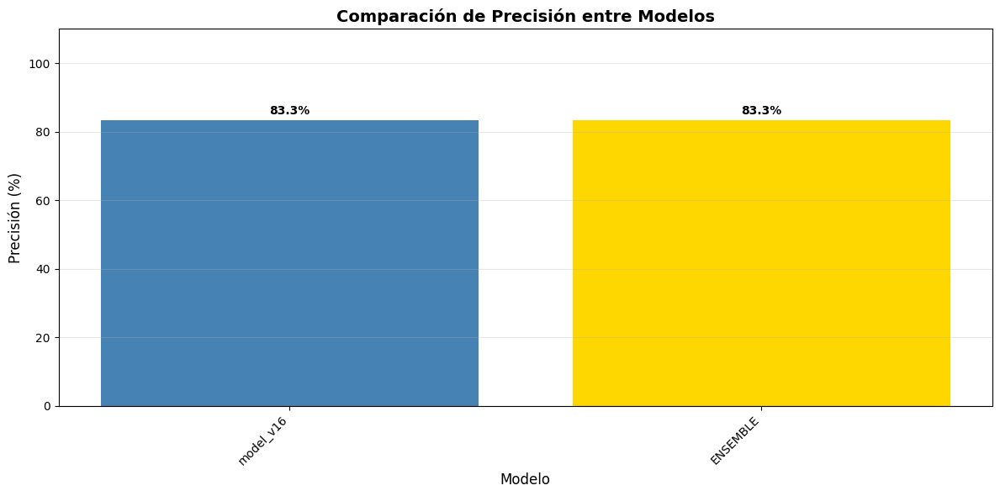

In [2]:
# Para analizar tu carpeta con todos los modelos:
results = analyze_folder_multi_model('manual3')

# Para graficar la comparación de precisiones (después del análisis):
if results:
    plot_accuracy_comparison(results['model_accuracies'], results['ensemble_accuracy'])